In [5]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [6]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [7]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [8]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, 
                                   scanlevel=False, tijmen=True, sybil=False)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3240 entries, 7664 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 2.5+ MB


In [12]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    "de Haas Combined": "Thijmen_mean_cal",
    "de Haas Local": "Thijmen_local_cal",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden_cal",
    "de Haas Global (shown nodule)": "Thijmen_global_show_cal",
    "PanCan2b": "PanCan2b",
    # "Sybil year 1": "sybil_year1",
    # "Sybil year 2": "sybil_year2",
    # "Sybil year 3": "sybil_year3",
    # "Sybil year 4": "sybil_year4",
    # "Sybil year 5": "sybil_year5",
    # "Sybil year 6": "sybil_year6",
}

Sanity check - let's see internal NLST validation results.

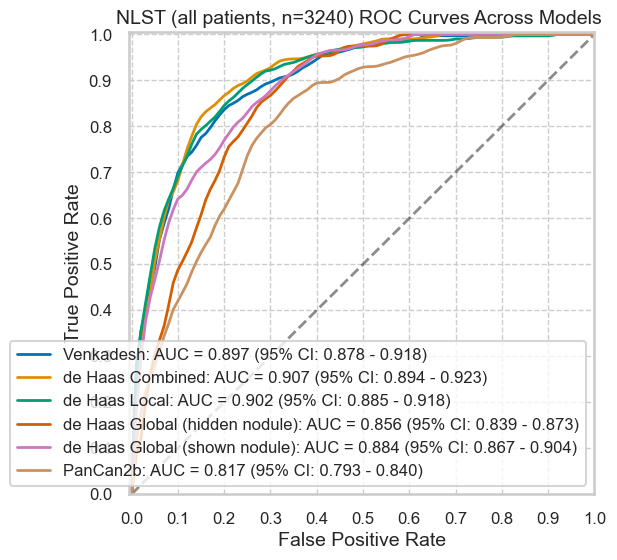

In [13]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [14]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL, min_mal=10)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("Not binary: not computing significance test results.")

### Included columns (from predictions)

#### Spiculation

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,3234,99.814815,275,8.503401
True,6,0.185185,6,100.000000


Not binary: not computing significance test results.


#### NoduleInUpperLung

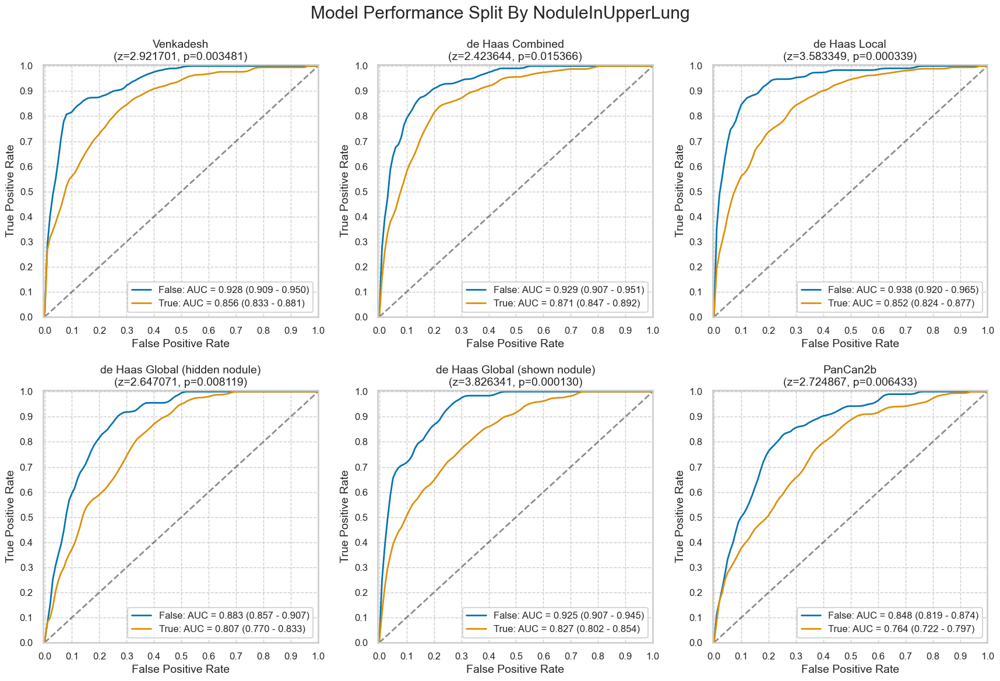

,num,pct,num_mal,pct_mal
False,1866,57.592593,113,6.055734
True,1374,42.407407,168,12.227074


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,2.921701,2.423644,3.583349,2.647071,3.826341,2.724867
p,0.003481,0.015366,0.000339,0.008119,0.000130,0.006433


#### Solid

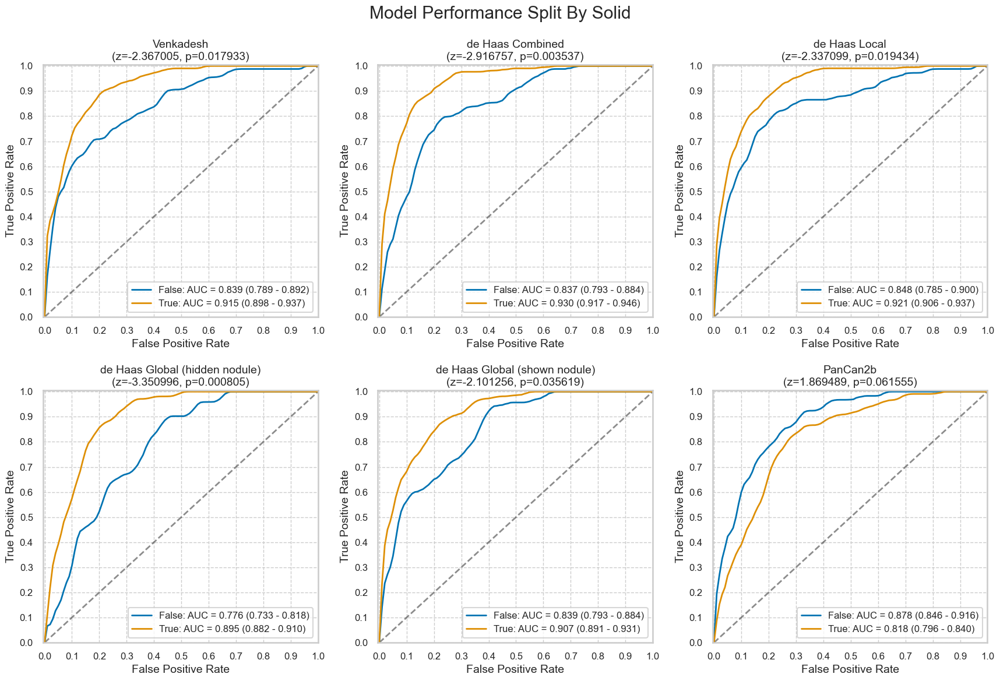

,num,pct,num_mal,pct_mal
False,1256,38.765432,70,5.573248
True,1984,61.234568,211,10.635081


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-2.367005,-2.916757,-2.337099,-3.350996,-2.101256,1.869489
p,0.017933,0.003537,0.019434,0.000805,0.035619,0.061555


#### GroundGlassOpacity

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,2513,77.561728,281,11.181854
True,727,22.438272,0,0.000000


Not binary: not computing significance test results.


#### Perifissural

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,3067,94.660494,281,9.162048
True,173,5.339506,0,0.000000


Not binary: not computing significance test results.


#### NonSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,3221,99.41358,262,8.13412
True,19,0.58642,19,100.00000


Not binary: not computing significance test results.


#### PartSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,3189,98.425926,230,7.212292
True,51,1.574074,51,100.000000


Not binary: not computing significance test results.


#### SemiSolid

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,2954,91.17284,281,9.512525
True,286,8.82716,0,0.000000


Not binary: not computing significance test results.


#### Calcified

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,3240,100.0,281,8.67284


Not binary: not computing significance test results.


In [16]:
for c in nlst_democols['cat']['nodule']:
    plot_by_category(nlst_preds, c)

### Demographics

#### marital

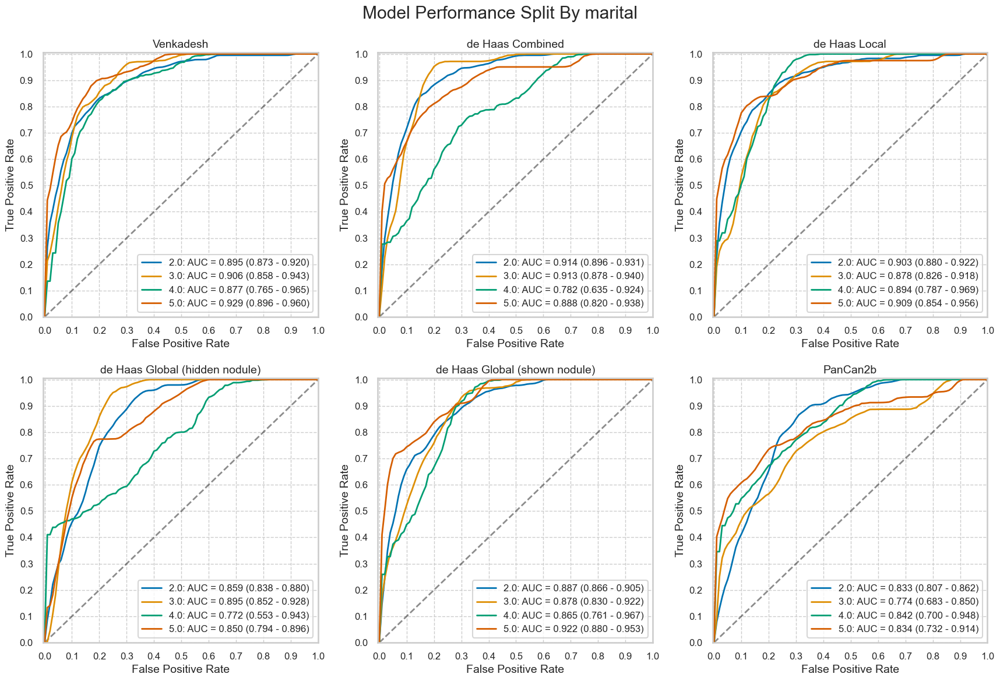

,num,pct,num_mal,pct_mal
1.0,114,3.521779,5,4.385965
2.0,2182,67.408094,188,8.615949
3.0,315,9.731233,35,11.111111
4.0,52,1.606426,10,19.230769
5.0,574,17.732468,43,7.491289


Not binary: not computing significance test results.


#### educat

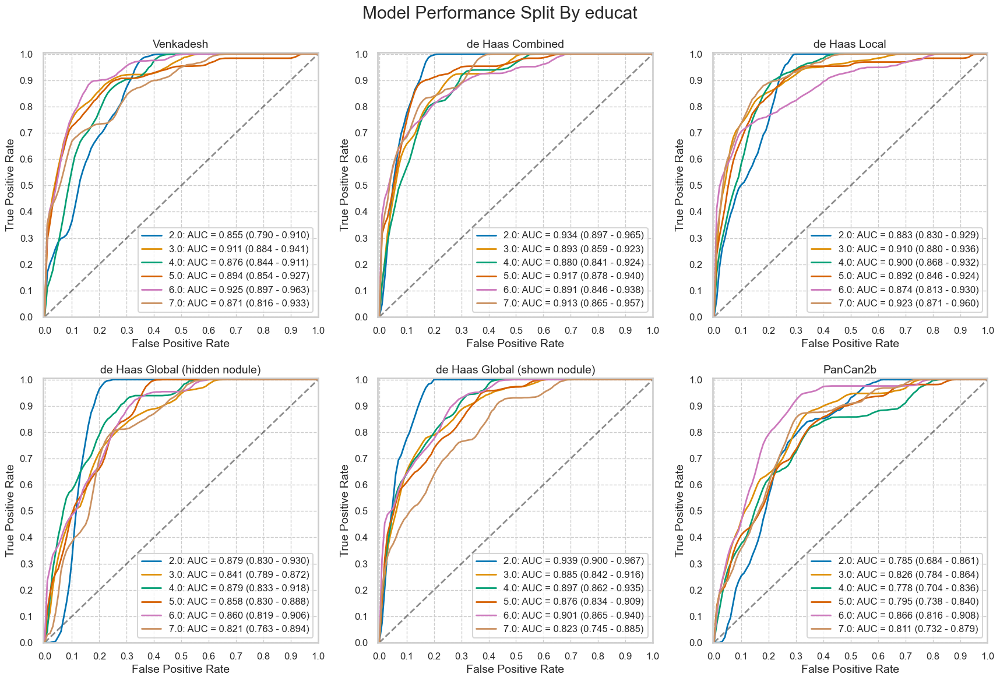

,num,pct,num_mal,pct_mal
1.0,75,2.339364,7,9.333333
2.0,218,6.799750,13,5.963303
3.0,801,24.984404,80,9.987516
4.0,443,13.817842,35,7.900677
5.0,680,21.210231,67,9.852941
6.0,532,16.593886,42,7.894737
7.0,457,14.254523,32,7.002188


Not binary: not computing significance test results.


#### race

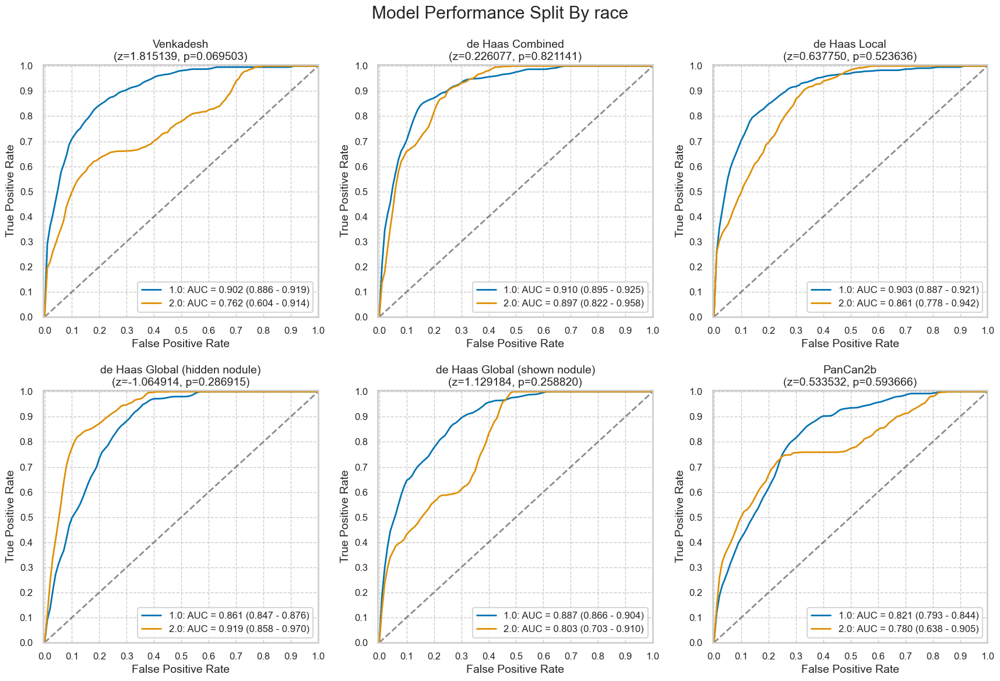

,num,pct,num_mal,pct_mal
1.0,3028,93.543404,253,8.355350
2.0,110,3.398208,13,11.818182
3.0,35,1.081248,3,8.571429
4.0,20,0.617856,8,40.000000
5.0,9,0.278035,1,11.111111
6.0,35,1.081248,3,8.571429


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.815139,0.226077,0.637750,-1.064914,1.129184,0.533532
p,0.069503,0.821141,0.523636,0.286915,0.258820,0.593666


#### ethnic

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
1.0,27,0.83669,3,11.111111
2.0,3200,99.16331,274,8.562500


Not binary: not computing significance test results.


#### Gender

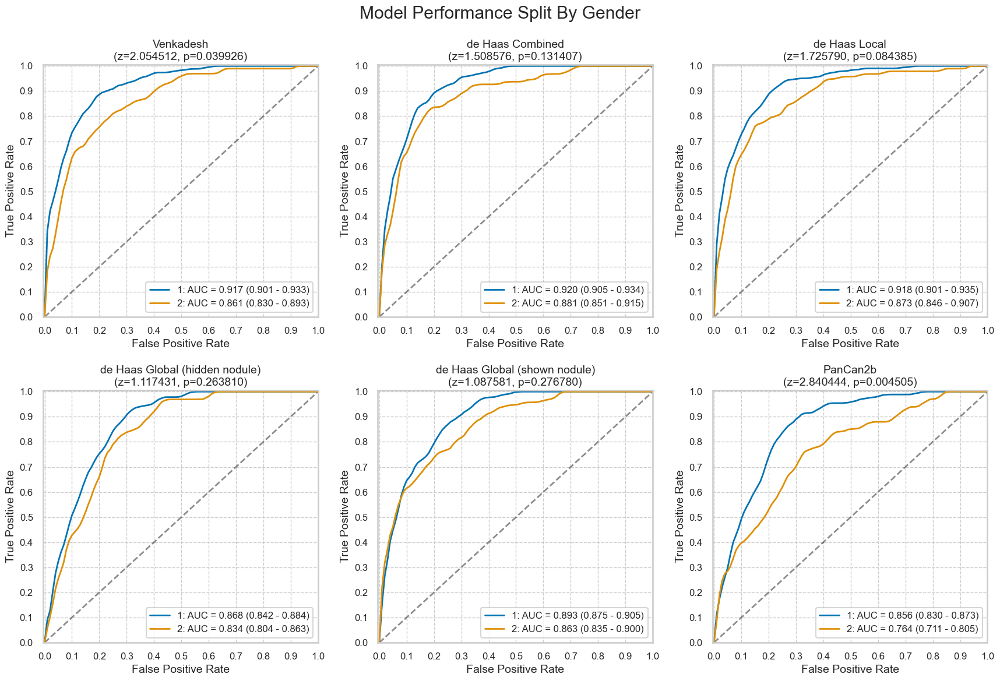

,num,pct,num_mal,pct_mal
1,1844,56.91358,179,9.707158
2,1396,43.08642,102,7.306590


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,2.054512,1.508576,1.725790,1.117431,1.087581,2.840444
p,0.039926,0.131407,0.084385,0.263810,0.276780,0.004505


#### Married

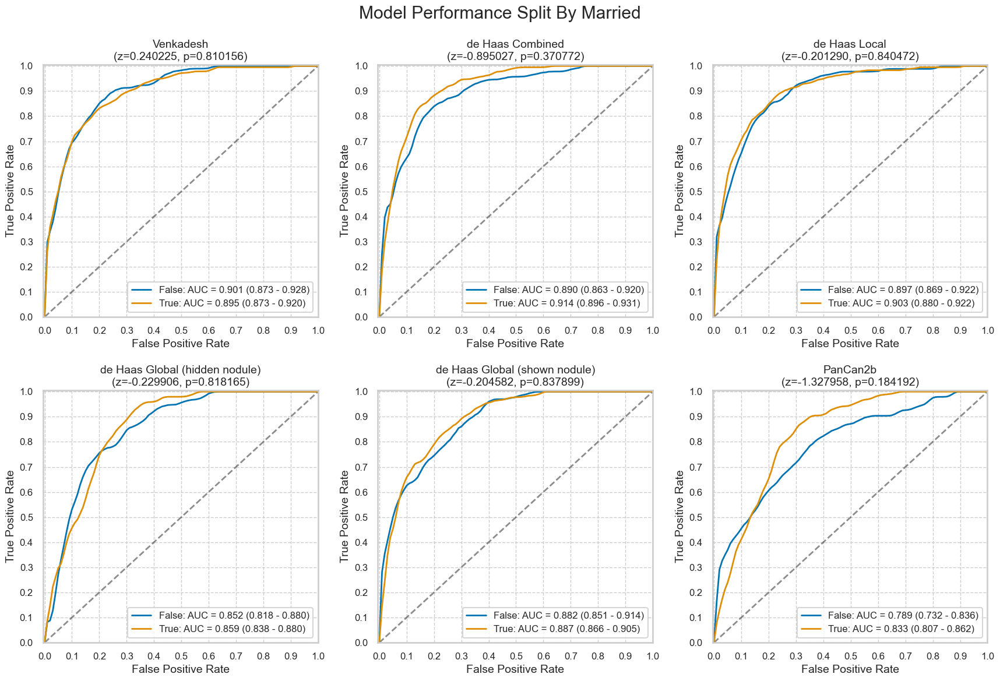

,num,pct,num_mal,pct_mal
False,1058,32.654321,93,8.790170
True,2182,67.345679,188,8.615949


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.240225,-0.895027,-0.201290,-0.229906,-0.204582,-1.327958
p,0.810156,0.370772,0.840472,0.818165,0.837899,0.184192


#### NonHispanicWhite

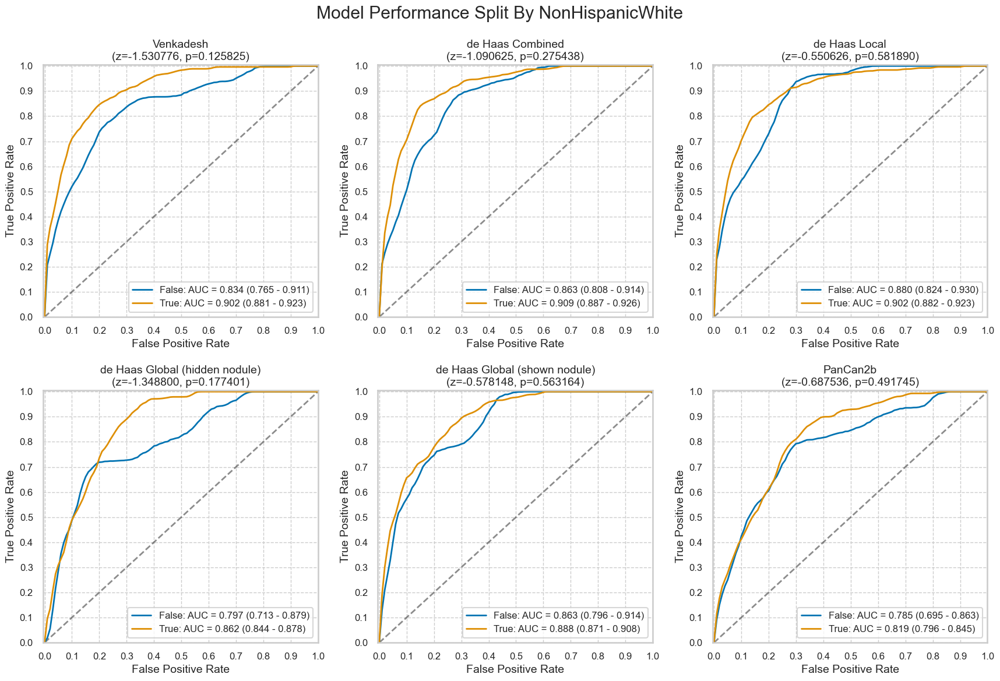

,num,pct,num_mal,pct_mal
False,246,7.592593,33,13.414634
True,2994,92.407407,248,8.283233


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.530776,-1.090625,-0.550626,-1.348800,-0.578148,-0.687536
p,0.125825,0.275438,0.581890,0.177401,0.563164,0.491745


#### HighSchoolPlus

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,75,2.314815,7,9.333333
True,3165,97.685185,274,8.657188


Not binary: not computing significance test results.


In [17]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

#### cigar

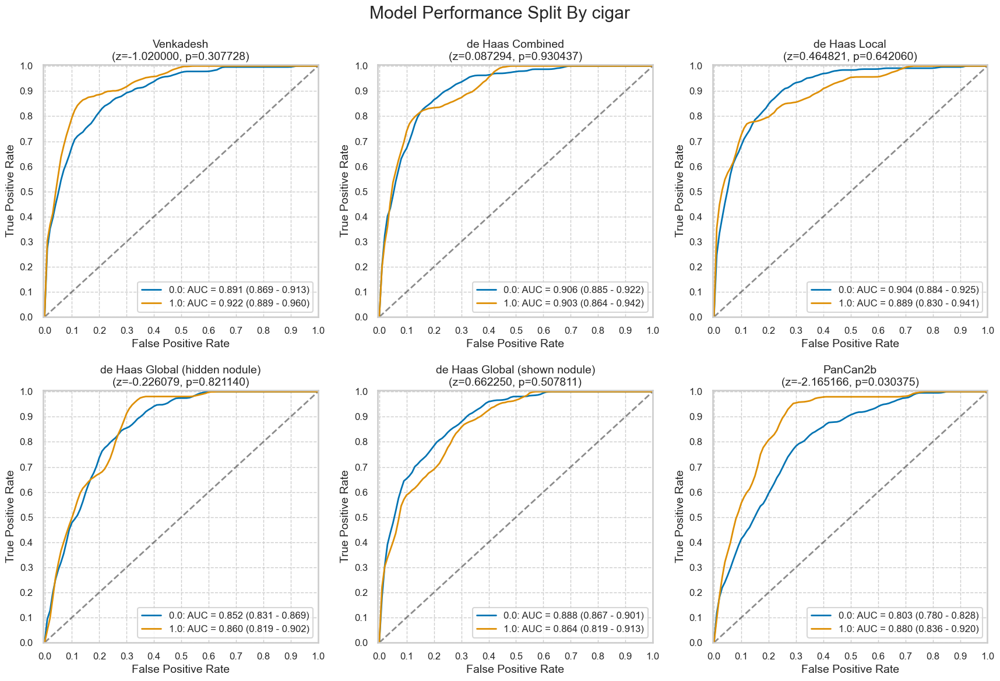

,num,pct,num_mal,pct_mal
0.0,2657,82.336535,230,8.656379
1.0,570,17.663465,50,8.771930


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.020000,0.087294,0.464821,-0.226079,0.662250,-2.165166
p,0.307728,0.930437,0.642060,0.821140,0.507811,0.030375


#### cigsmok

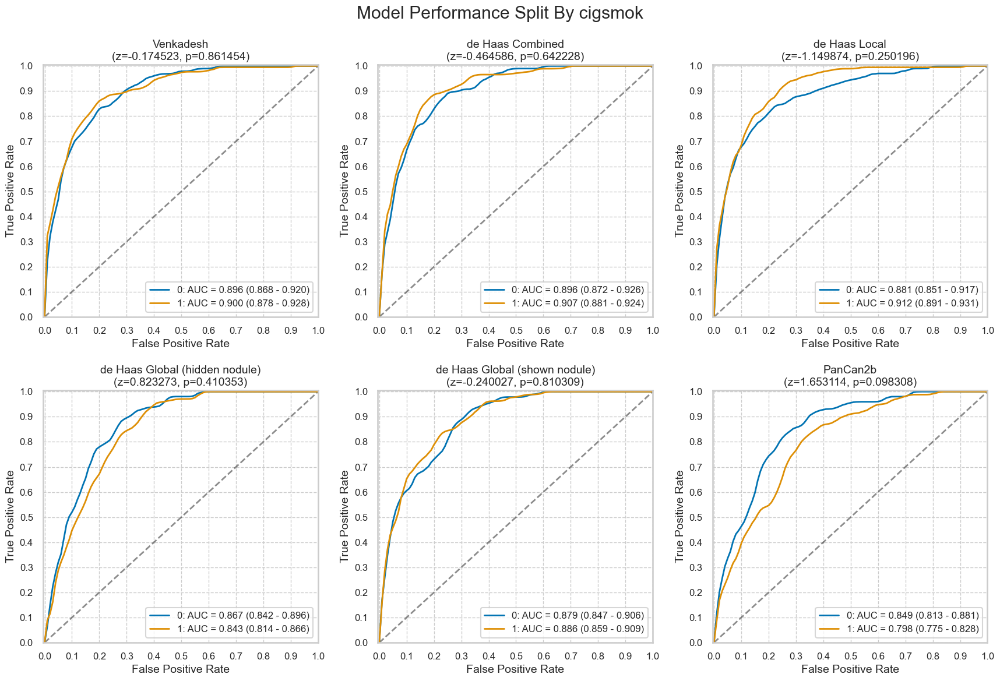

,num,pct,num_mal,pct_mal
0,1592,49.135802,102,6.407035
1,1648,50.864198,179,10.861650


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.174523,-0.464586,-1.149874,0.823273,-0.240027,1.653114
p,0.861454,0.642228,0.250196,0.410353,0.810309,0.098308


#### pipe

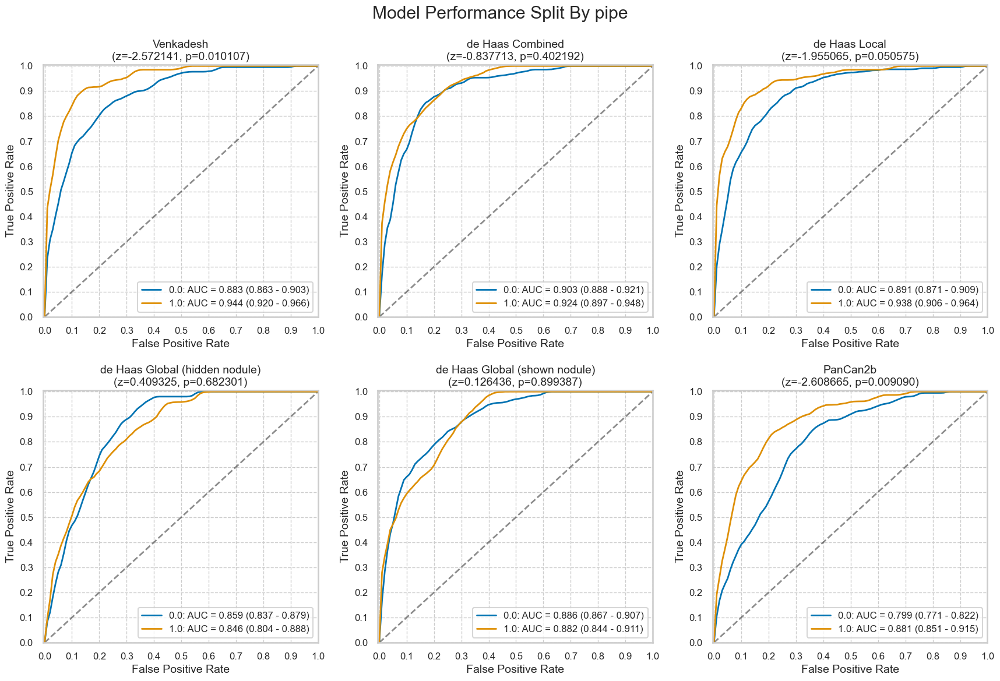

,num,pct,num_mal,pct_mal
0.0,2519,78.205526,206,8.177848
1.0,702,21.794474,74,10.541311


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-2.572141,-0.837713,-1.955065,0.409325,0.126436,-2.608665
p,0.010107,0.402192,0.050575,0.682301,0.899387,0.009090


#### smokelive

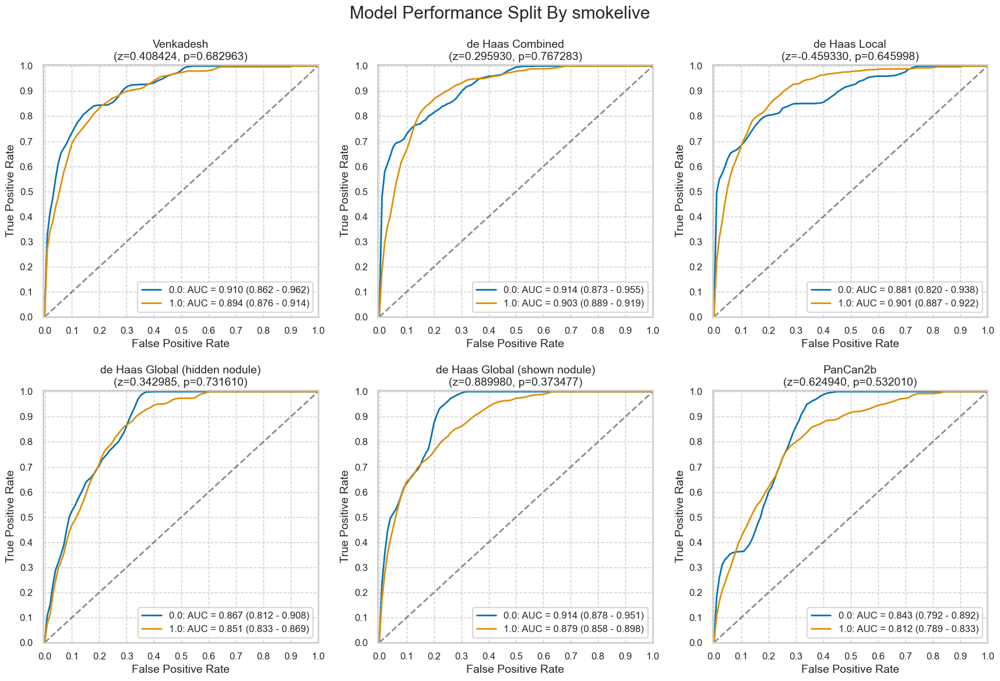

,num,pct,num_mal,pct_mal
0.0,441,13.67018,27,6.122449
1.0,2785,86.32982,253,9.084381


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.408424,0.295930,-0.459330,0.342985,0.889980,0.62494
p,0.682963,0.767283,0.645998,0.731610,0.373477,0.53201


#### smokework

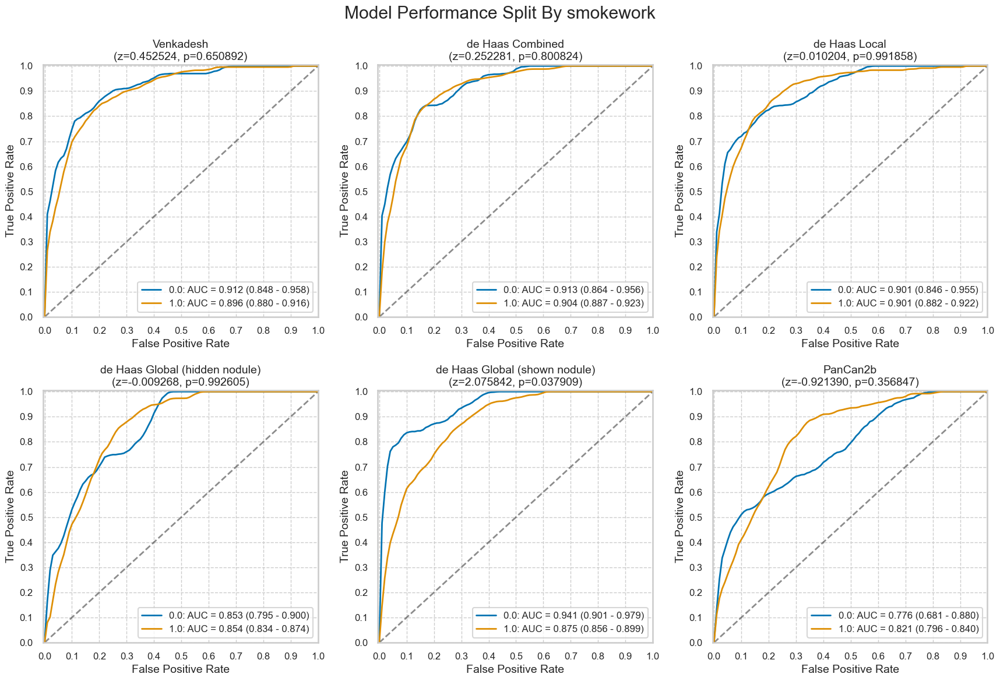

,num,pct,num_mal,pct_mal
0.0,416,12.939347,34,8.173077
1.0,2799,87.060653,247,8.824580


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.452524,0.252281,0.010204,-0.009268,2.075842,-0.921390
p,0.650892,0.800824,0.991858,0.992605,0.037909,0.356847


In [19]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

#### wrkasbe

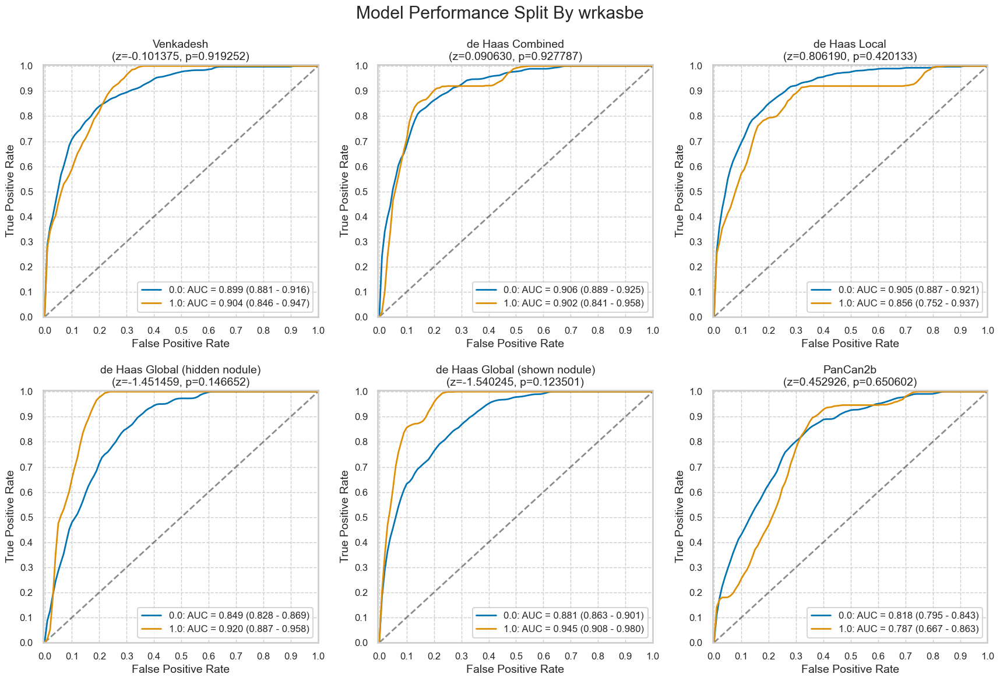

,num,pct,num_mal,pct_mal
0.0,2980,92.003705,265,8.892617
1.0,259,7.996295,16,6.177606


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.101375,0.090630,0.806190,-1.451459,-1.540245,0.452926
p,0.919252,0.927787,0.420133,0.146652,0.123501,0.650602


#### wrkbaki

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3179,98.117284,278,8.744888
1.0,61,1.882716,3,4.918033


Not binary: not computing significance test results.


#### wrkbutc

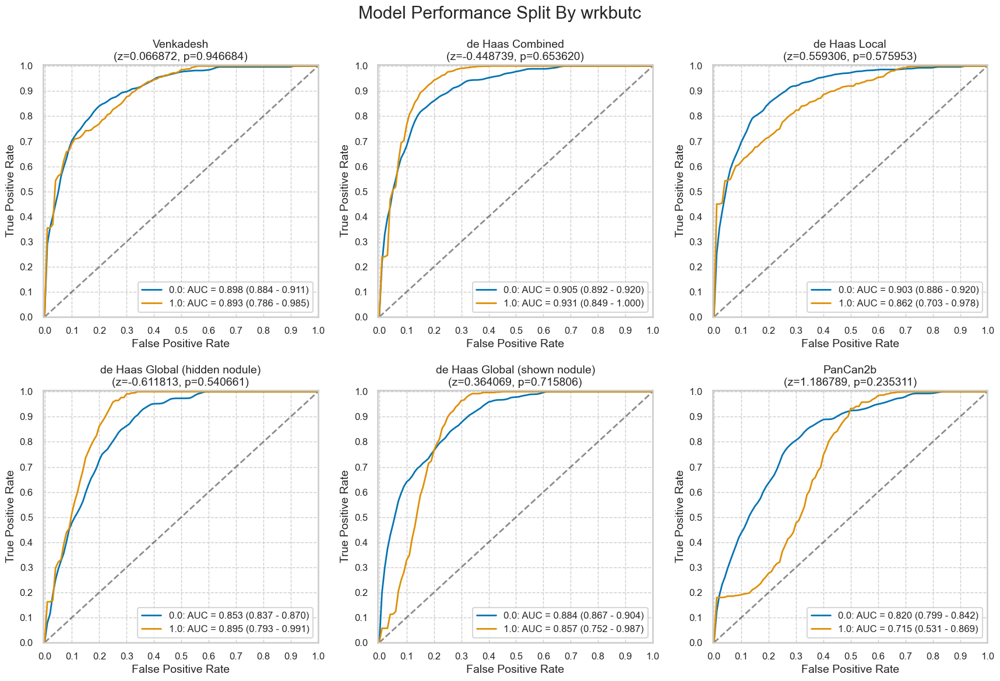

,num,pct,num_mal,pct_mal
0.0,3201,98.796296,271,8.466104
1.0,39,1.203704,10,25.641026


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.066872,-0.448739,0.559306,-0.611813,0.364069,1.186789
p,0.946684,0.653620,0.575953,0.540661,0.715806,0.235311


#### wrkchem

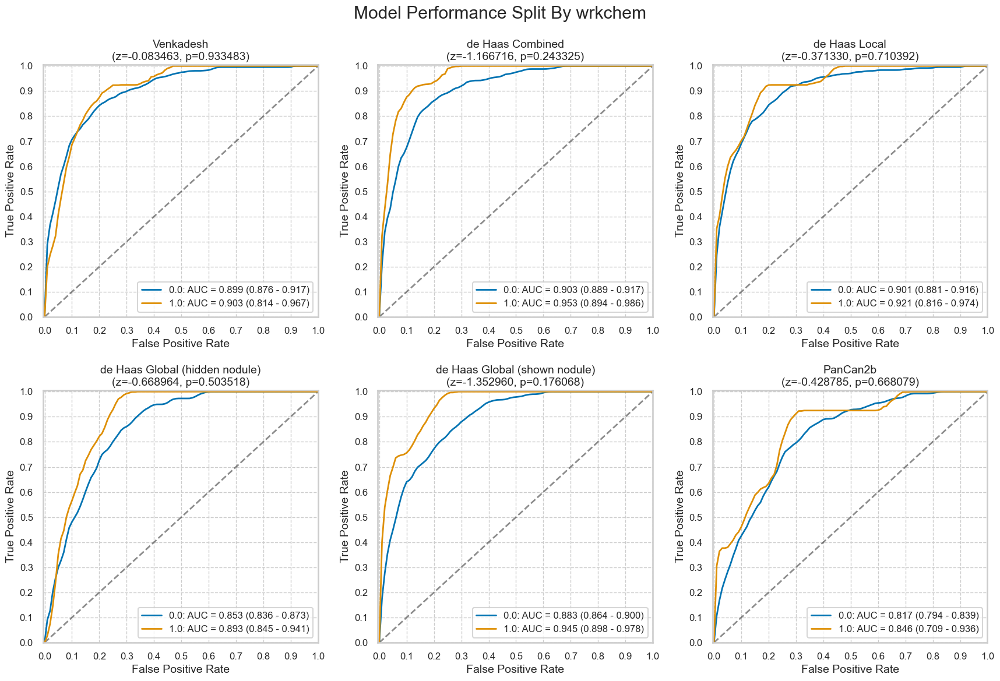

,num,pct,num_mal,pct_mal
0.0,3000,92.764378,268,8.933333
1.0,234,7.235622,13,5.555556


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.083463,-1.166716,-0.371330,-0.668964,-1.352960,-0.428785
p,0.933483,0.243325,0.710392,0.503518,0.176068,0.668079


#### wrkcoal

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3213,99.166667,280,8.714597
1.0,27,0.833333,1,3.703704


Not binary: not computing significance test results.


#### wrkcott

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3220,99.382716,275,8.540373
1.0,20,0.617284,6,30.000000


Not binary: not computing significance test results.


#### wrkfarm

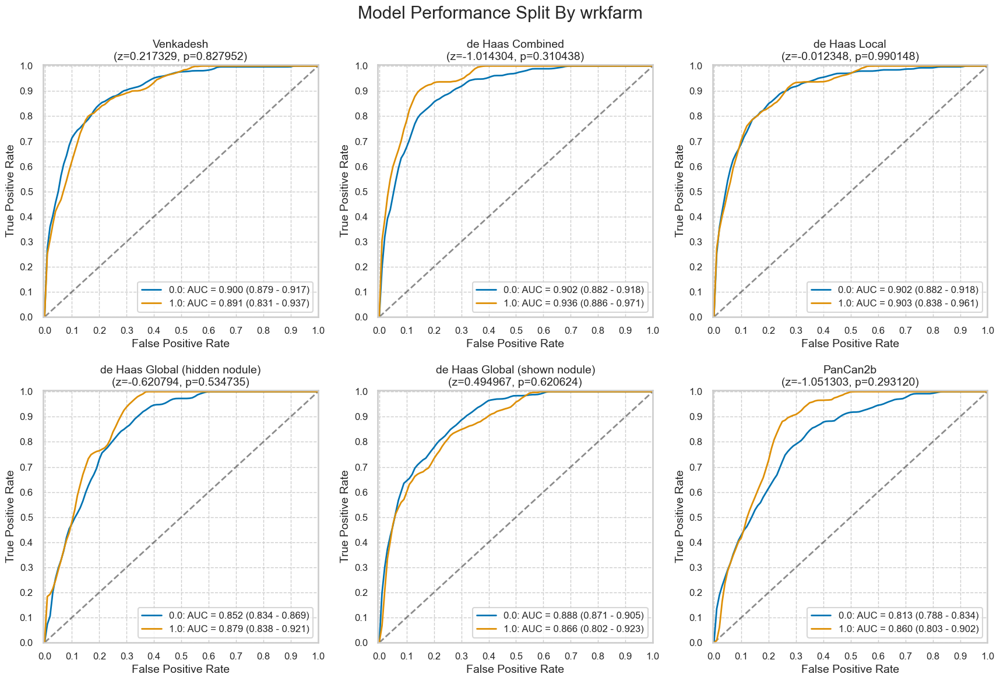

,num,pct,num_mal,pct_mal
0.0,2841,87.685185,250,8.799718
1.0,399,12.314815,31,7.769424


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.217329,-1.014304,-0.012348,-0.620794,0.494967,-1.051303
p,0.827952,0.310438,0.990148,0.534735,0.620624,0.293120


#### wrkfire

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3192,98.518519,275,8.615288
1.0,48,1.481481,6,12.500000


Not binary: not computing significance test results.


#### wrkflou

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3190,98.45679,278,8.714734
1.0,50,1.54321,3,6.000000


Not binary: not computing significance test results.


#### wrkfoun

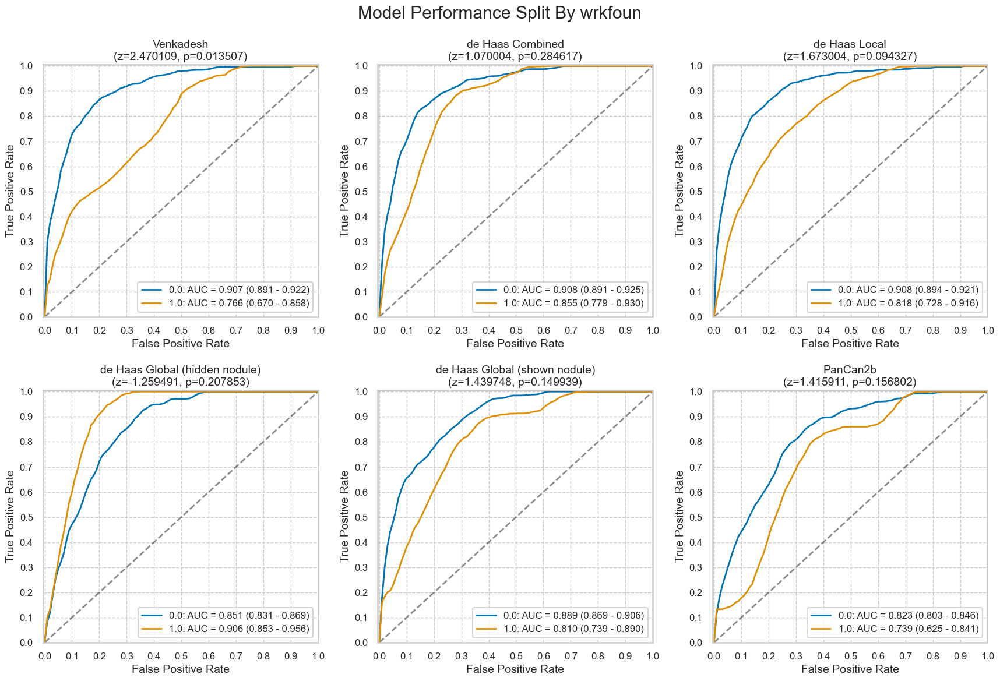

,num,pct,num_mal,pct_mal
0.0,3112,96.049383,258,8.290488
1.0,128,3.950617,23,17.968750


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,2.470109,1.070004,1.673004,-1.259491,1.439748,1.415911
p,0.013507,0.284617,0.094327,0.207853,0.149939,0.156802


#### wrkhard

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3216,99.259259,281,8.737562
1.0,24,0.740741,0,0.000000


Not binary: not computing significance test results.


#### wrkpain

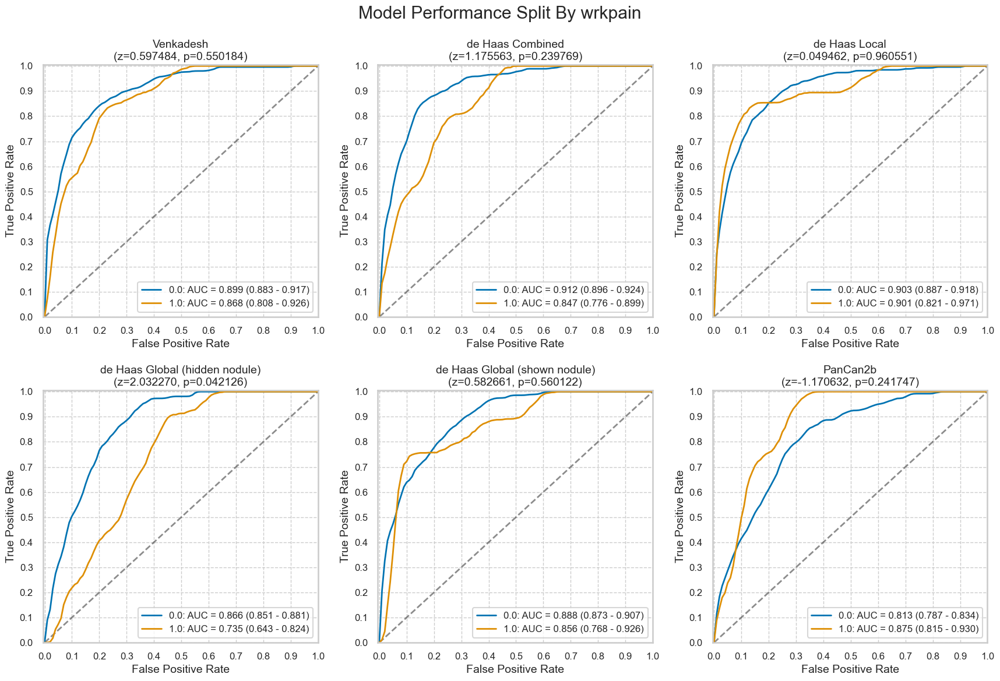

,num,pct,num_mal,pct_mal
0.0,3044,93.950617,261,8.574244
1.0,196,6.049383,20,10.204082


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.597484,1.175563,0.049462,2.032270,0.582661,-1.170632
p,0.550184,0.239769,0.960551,0.042126,0.560122,0.241747


#### wrksand

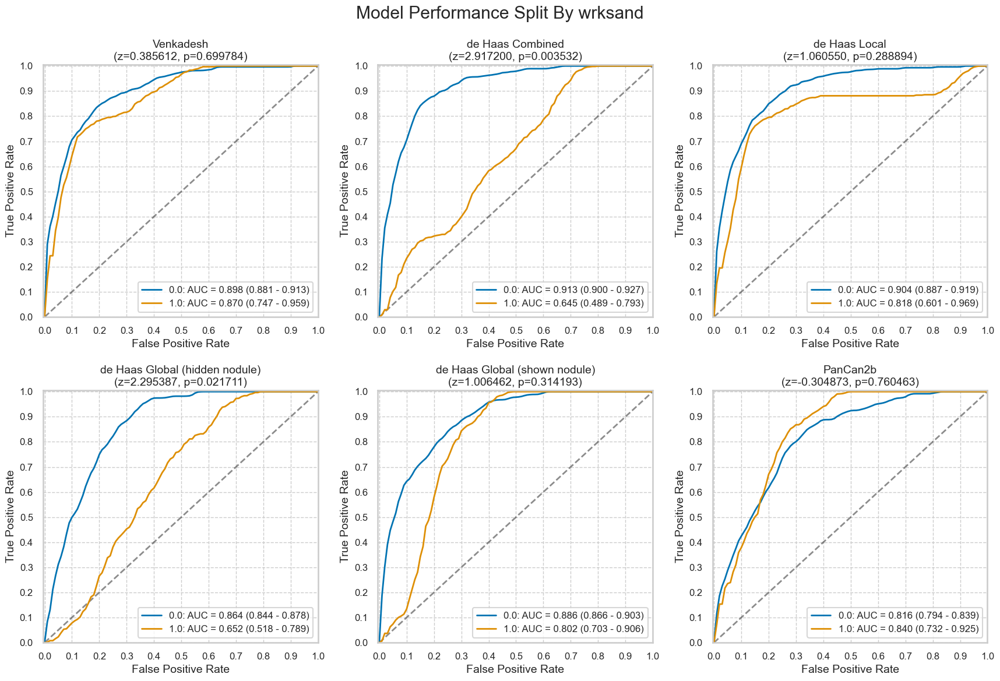

,num,pct,num_mal,pct_mal
0.0,3171,97.87037,271,8.546200
1.0,69,2.12963,10,14.492754


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.385612,2.917200,1.060550,2.295387,1.006462,-0.304873
p,0.699784,0.003532,0.288894,0.021711,0.314193,0.760463


#### wrkweld

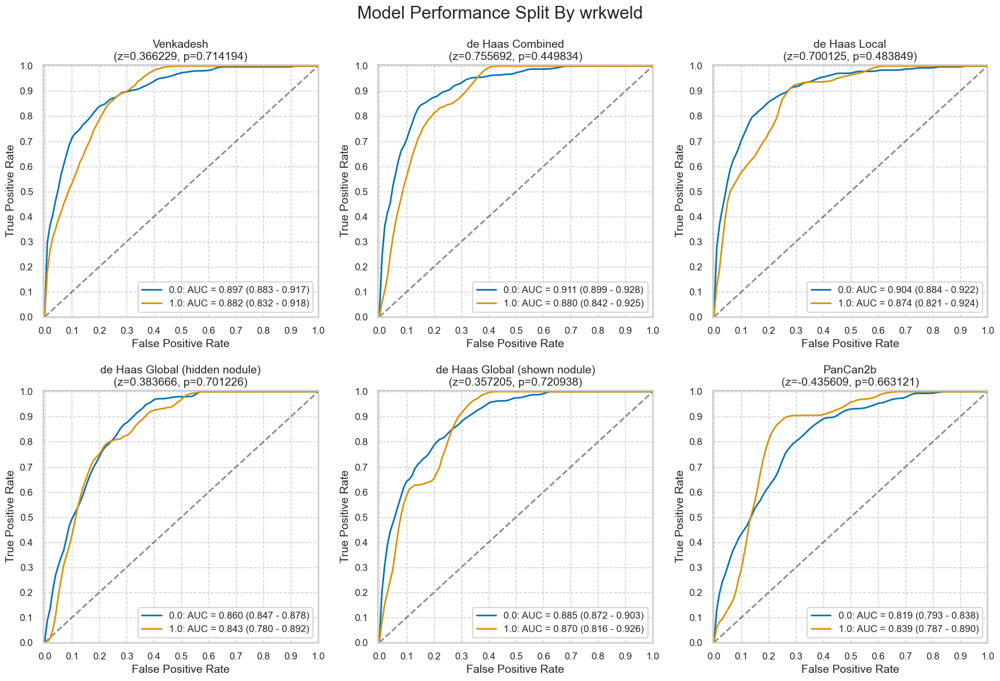

,num,pct,num_mal,pct_mal
0.0,3007,92.808642,250,8.313934
1.0,233,7.191358,31,13.304721


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.366229,0.755692,0.700125,0.383666,0.357205,-0.435609
p,0.714194,0.449834,0.483849,0.701226,0.720938,0.663121


In [20]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

#### Emphysema

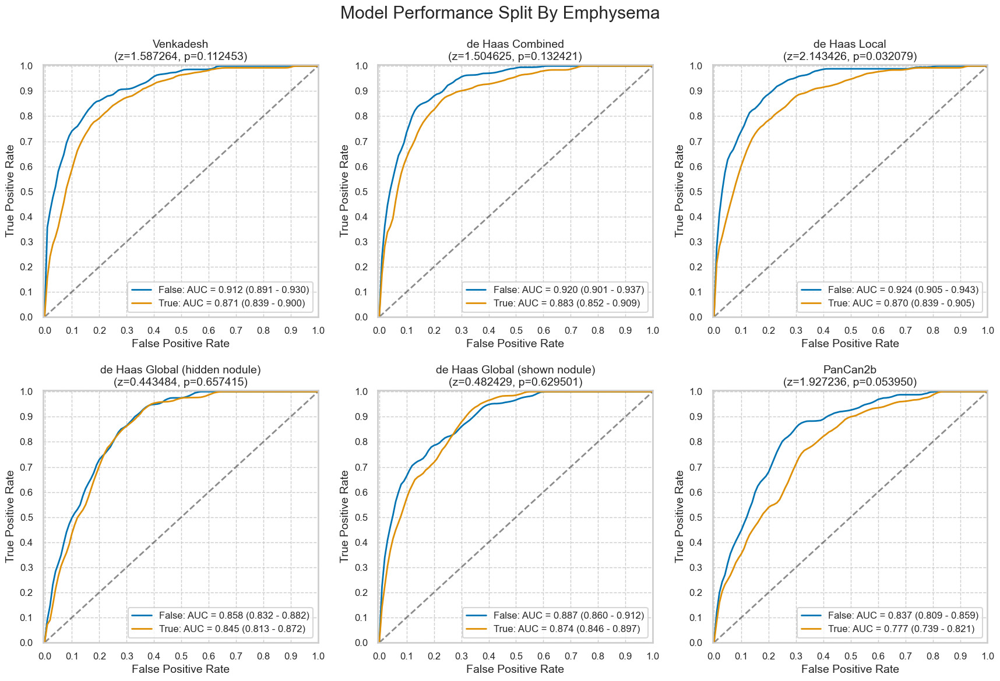

,num,pct,num_mal,pct_mal
False,2118,65.37037,156,7.365439
True,1122,34.62963,125,11.140820


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.587264,1.504625,2.143426,0.443484,0.482429,1.927236
p,0.112453,0.132421,0.032079,0.657415,0.629501,0.053950


In [21]:
plot_by_category(nlst_preds, 'Emphysema')

#### diagadas

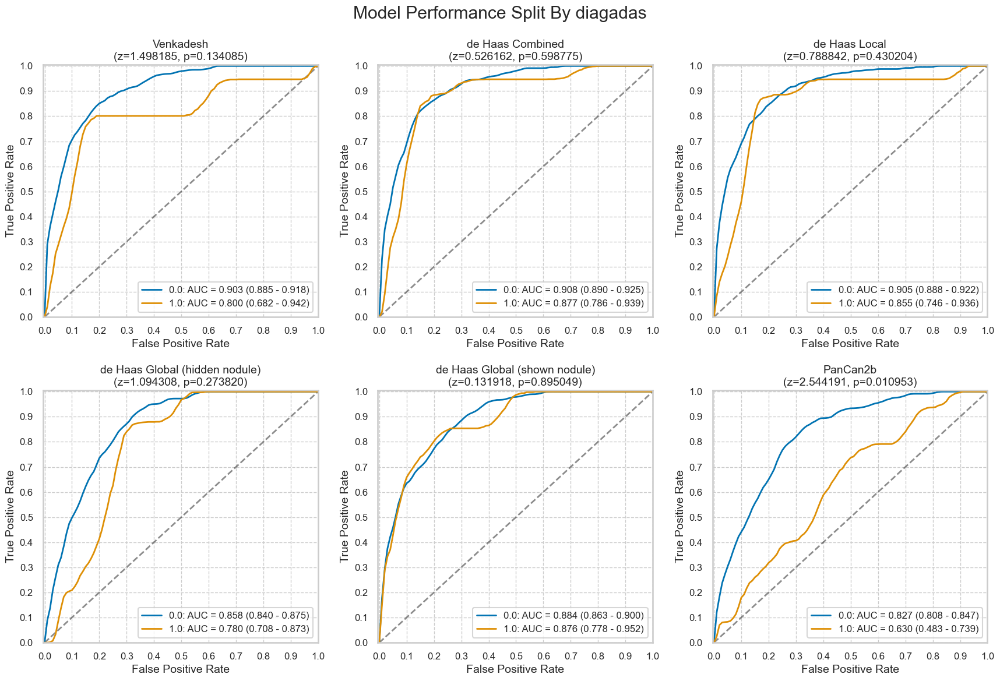

,num,pct,num_mal,pct_mal
0.0,3032,93.695921,263,8.674142
1.0,204,6.304079,15,7.352941


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.498185,0.526162,0.788842,1.094308,0.131918,2.544191
p,0.134085,0.598775,0.430204,0.273820,0.895049,0.010953


#### diagasbe

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3175,98.054355,281,8.850394
1.0,63,1.945645,0,0.000000


Not binary: not computing significance test results.


#### diagbron

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3085,95.451733,274,8.881686
1.0,147,4.548267,4,2.721088


Not binary: not computing significance test results.


#### diagchas

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3108,95.955542,279,8.976834
1.0,131,4.044458,2,1.526718


Not binary: not computing significance test results.


#### diagchro

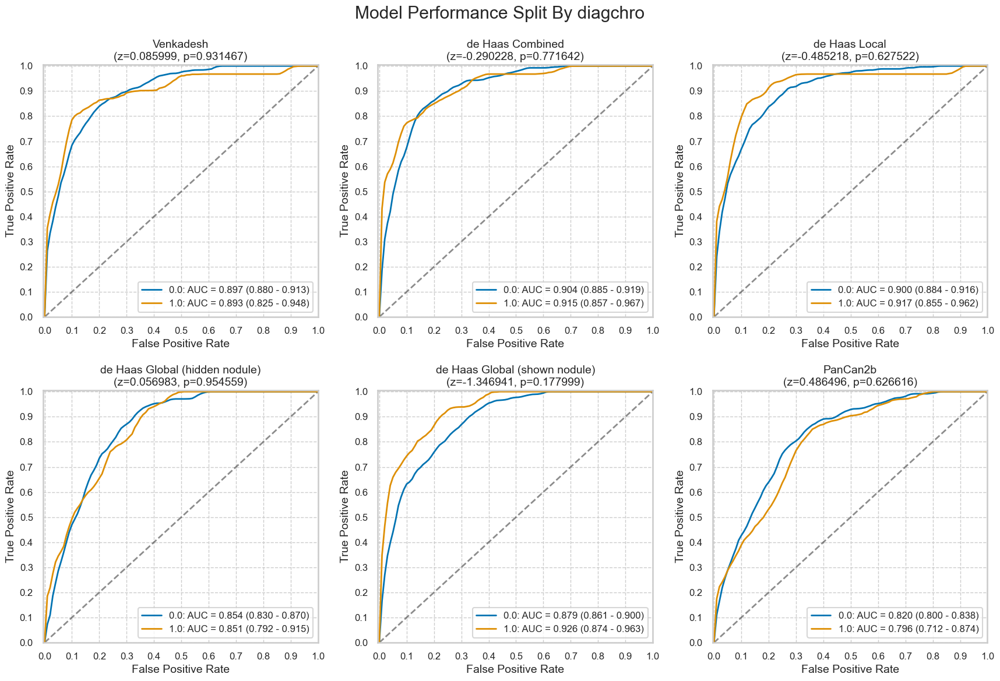

,num,pct,num_mal,pct_mal
0.0,2869,88.741107,246,8.574416
1.0,364,11.258893,32,8.791209


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.085999,-0.290228,-0.485218,0.056983,-1.346941,0.486496
p,0.931467,0.771642,0.627522,0.954559,0.177999,0.626616


#### diagcopd

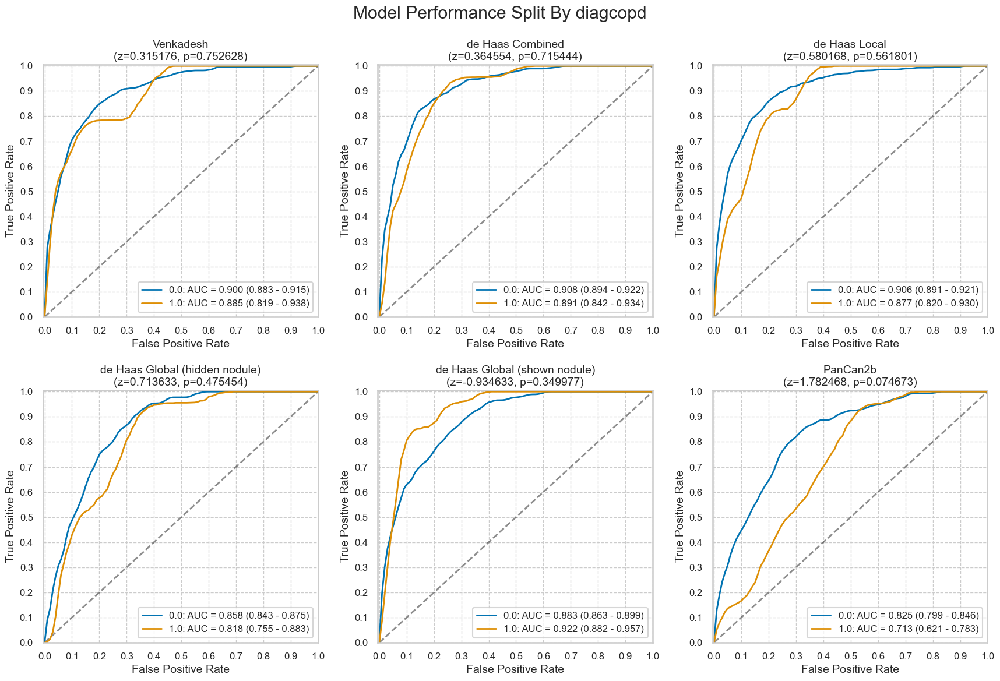

,num,pct,num_mal,pct_mal
0.0,3011,93.104515,259,8.601793
1.0,223,6.895485,22,9.865471


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.315176,0.364554,0.580168,0.713633,-0.934633,1.782468
p,0.752628,0.715444,0.561801,0.475454,0.349977,0.074673


#### diagdiab

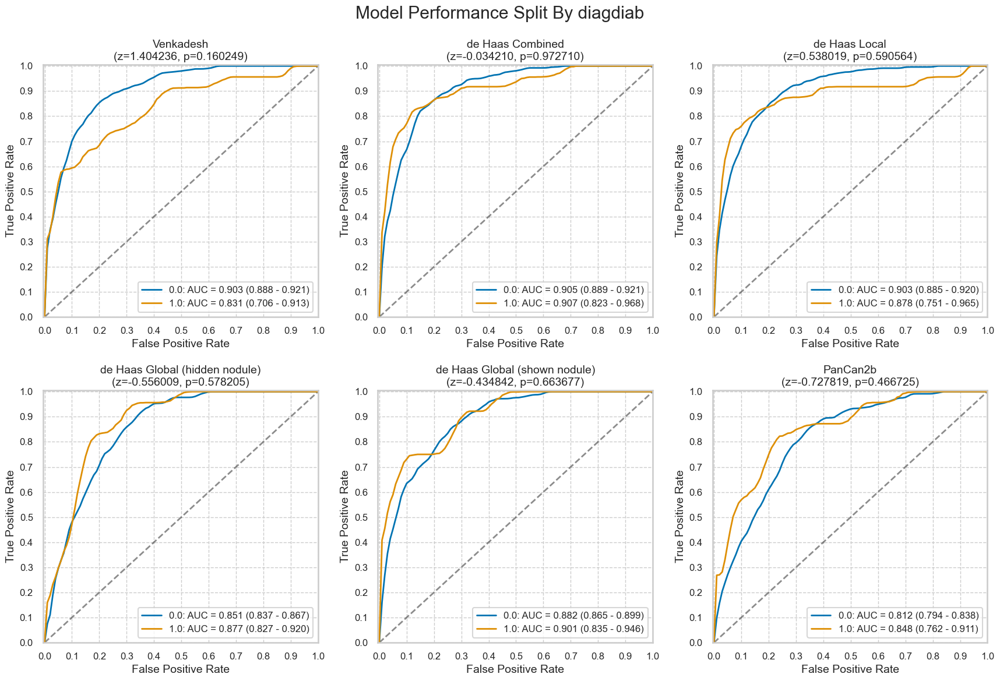

,num,pct,num_mal,pct_mal
0.0,2880,88.888889,256,8.888889
1.0,360,11.111111,25,6.944444


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.404236,-0.03421,0.538019,-0.556009,-0.434842,-0.727819
p,0.160249,0.97271,0.590564,0.578205,0.663677,0.466725


#### diagemph

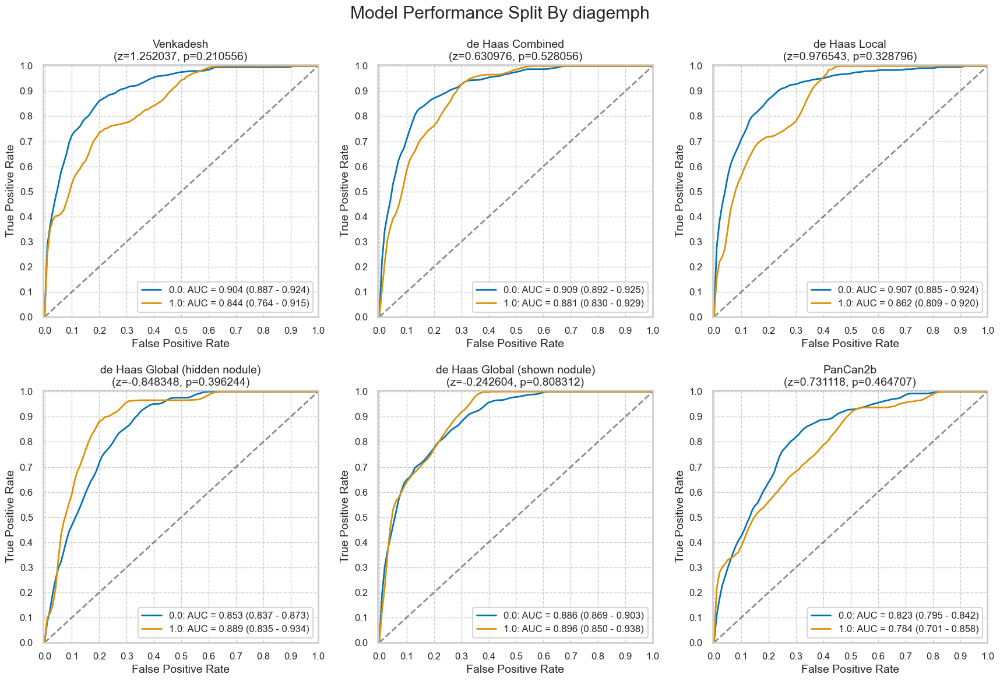

,num,pct,num_mal,pct_mal
0.0,2908,89.86403,253,8.700138
1.0,328,10.13597,28,8.536585


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.252037,0.630976,0.976543,-0.848348,-0.242604,0.731118
p,0.210556,0.528056,0.328796,0.396244,0.808312,0.464707


#### diagfibr

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3230,99.691358,281,8.69969
1.0,10,0.308642,0,0.00000


Not binary: not computing significance test results.


#### diaghear

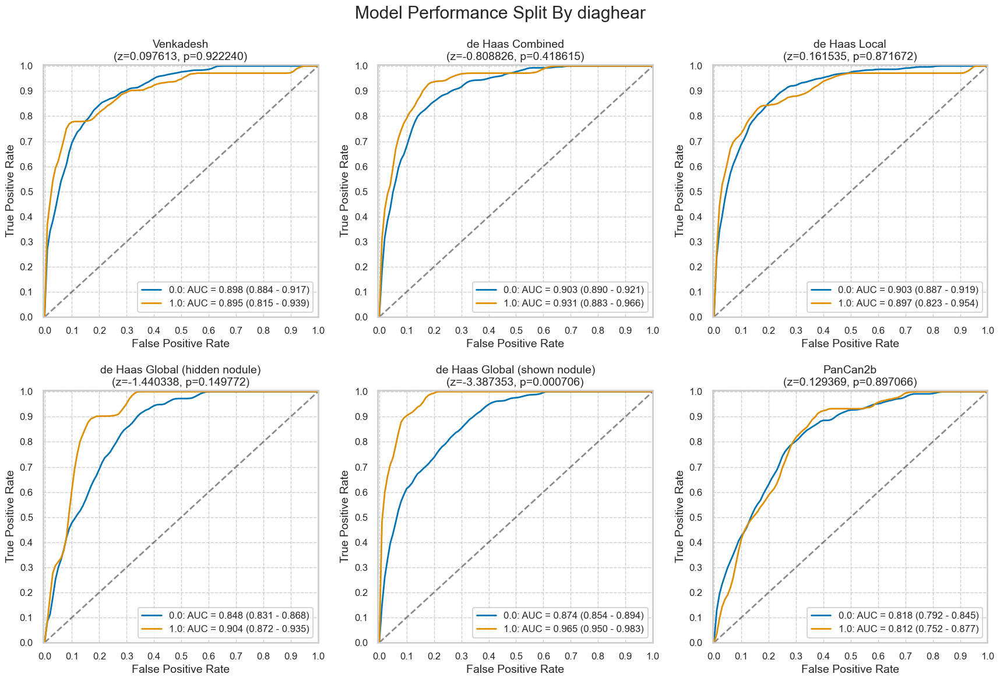

,num,pct,num_mal,pct_mal
0.0,2820,87.306502,250,8.865248
1.0,410,12.693498,31,7.560976


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.097613,-0.808826,0.161535,-1.440338,-3.387353,0.129369
p,0.922240,0.418615,0.871672,0.149772,0.000706,0.897066


#### diaghype

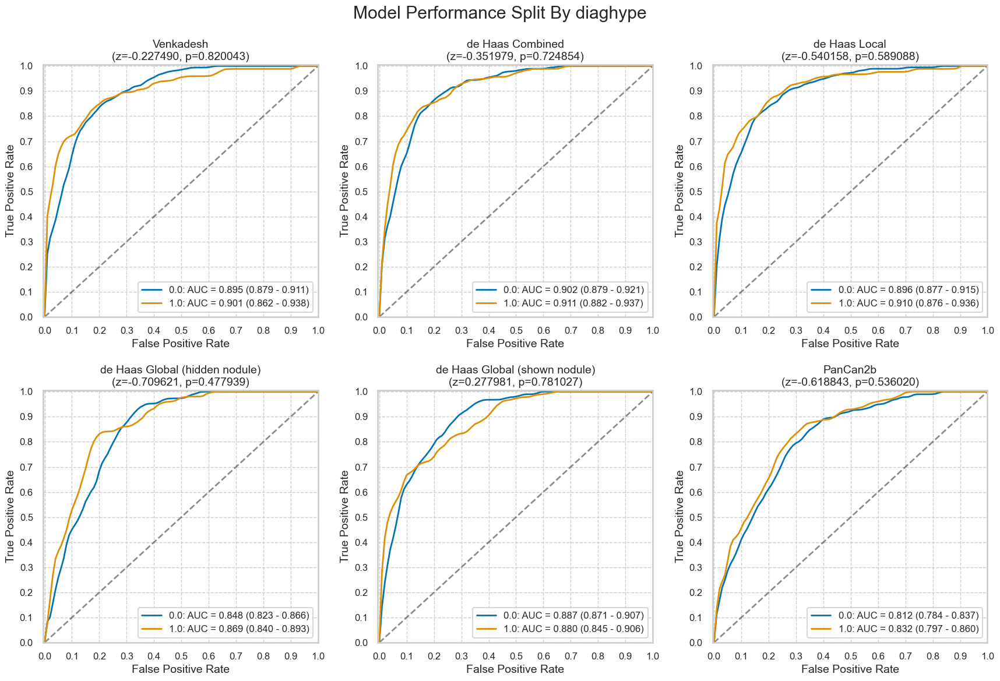

,num,pct,num_mal,pct_mal
0.0,2185,67.521632,183,8.375286
1.0,1051,32.478368,95,9.039010


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.227490,-0.351979,-0.540158,-0.709621,0.277981,-0.618843
p,0.820043,0.724854,0.589088,0.477939,0.781027,0.536020


#### diagpneu

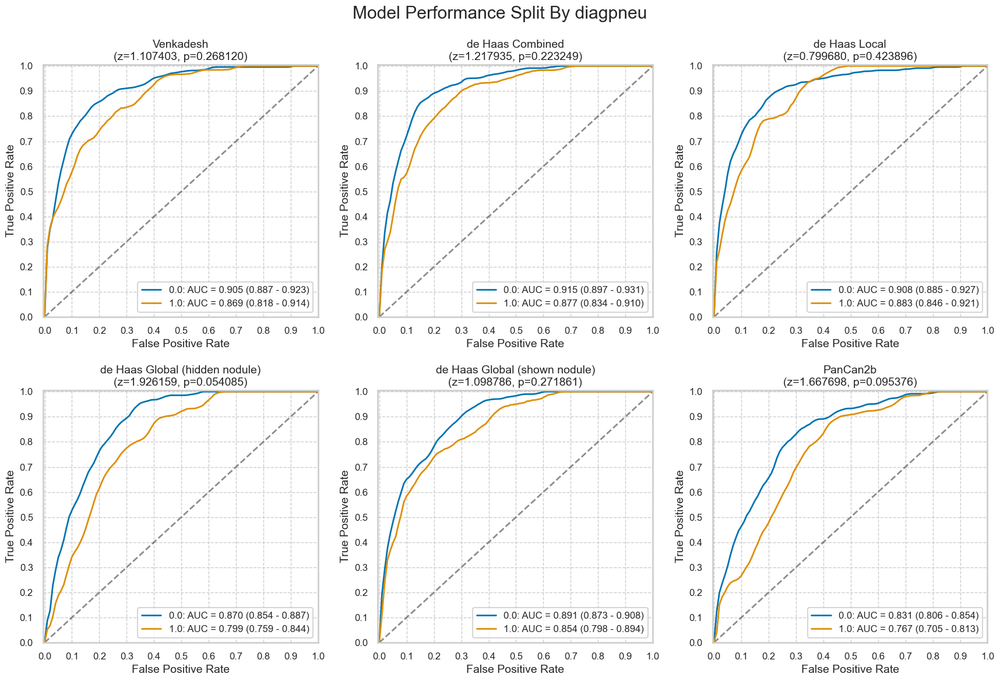

,num,pct,num_mal,pct_mal
0.0,2496,77.179963,220,8.814103
1.0,738,22.820037,61,8.265583


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.107403,1.217935,0.799680,1.926159,1.098786,1.667698
p,0.268120,0.223249,0.423896,0.054085,0.271861,0.095376


#### diagsarc

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3238,99.938272,280,8.647313
1.0,2,0.061728,1,50.000000


Not binary: not computing significance test results.


#### diagsili

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3237,99.907407,281,8.680877
1.0,3,0.092593,0,0.000000


Not binary: not computing significance test results.


#### diagstro

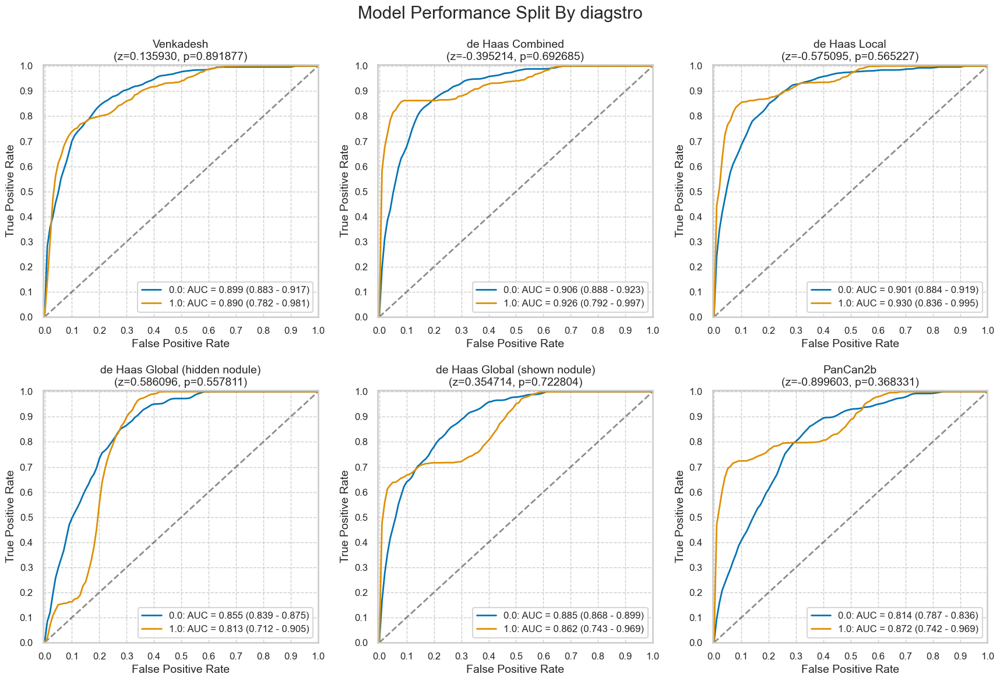

,num,pct,num_mal,pct_mal
0.0,3143,97.036122,268,8.526885
1.0,96,2.963878,13,13.541667


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.135930,-0.395214,-0.575095,0.586096,0.354714,-0.899603
p,0.891877,0.692685,0.565227,0.557811,0.722804,0.368331


#### diagtube

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
0.0,3186,98.333333,281,8.819837
1.0,54,1.666667,0,0.000000


Not binary: not computing significance test results.


In [22]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

### Personal cancer history

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\673829288.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['PersonalCancerHist'] = nlst_preds[nlst_democols['cat']['canchist']].any(axis=1)


#### PersonalCancerHist

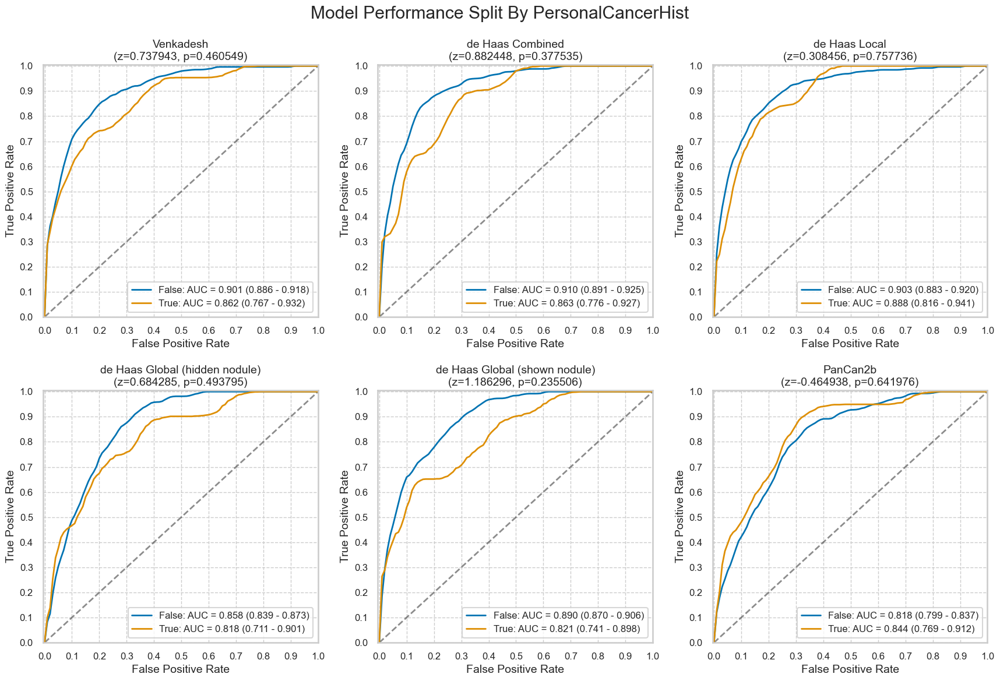

,num,pct,num_mal,pct_mal
False,3086,95.246914,261,8.457550
True,154,4.753086,20,12.987013


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.737943,0.882448,0.308456,0.684285,1.186296,-0.464938
p,0.460549,0.377535,0.757736,0.493795,0.235506,0.641976


In [23]:
nlst_preds['PersonalCancerHist'] = nlst_preds[nlst_democols['cat']['canchist']].any(axis=1)
plot_by_category(nlst_preds, 'PersonalCancerHist')

## Binning for numerical columns

### Demographic columns

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,67.886448,3.719267,59.0,65.0,68.0,71.0,78.0
1,280.0,68.335714,3.618175,60.0,66.0,69.0,71.0,76.0


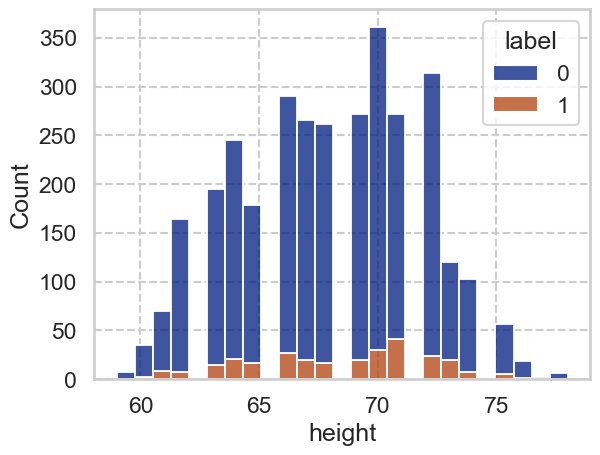

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2957.0,182.767332,39.320755,90.0,155.0,178.0,207.0,322.0
1,281.0,175.893238,35.314748,108.0,150.0,175.0,196.0,322.0


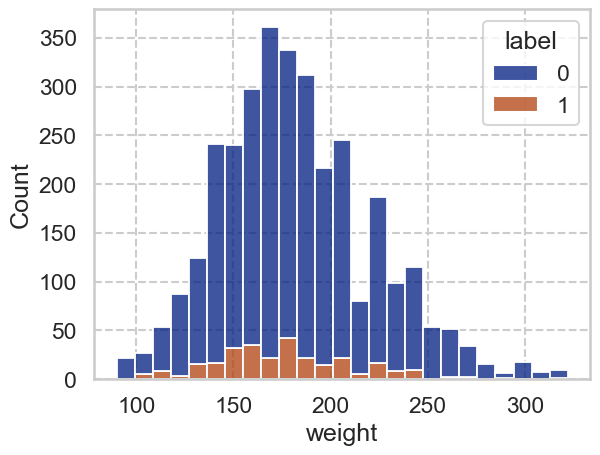

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,63.451504,5.221943,55.0,59.0,63.0,67.0,76.0
1,281.0,64.320285,5.000419,55.0,61.0,64.0,68.0,75.0


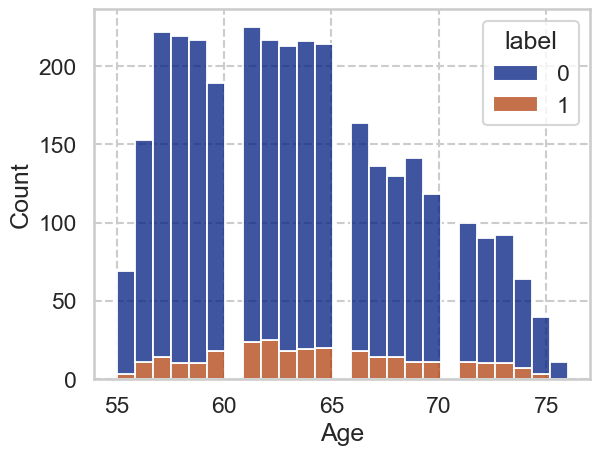

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2957.0,27.773174,5.084312,16.242386,24.207989,27.259184,30.819350,53.401665
1,280.0,26.413375,4.472598,18.302959,23.687020,25.824490,28.984531,47.587692


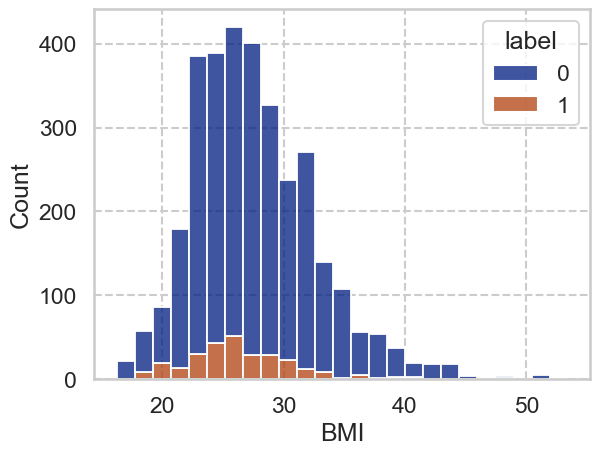

In [24]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\804098061.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=3)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\804098061.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(54.999, 61.0]",1294.0,0.069552,0.254488,0.0,0.0,0.0,0.0,1.0
"(61.0, 66.0]",1024.0,0.097656,0.296994,0.0,0.0,0.0,0.0,1.0
"(66.0, 76.0]",922.0,0.098698,0.298419,0.0,0.0,0.0,0.0,1.0


#### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


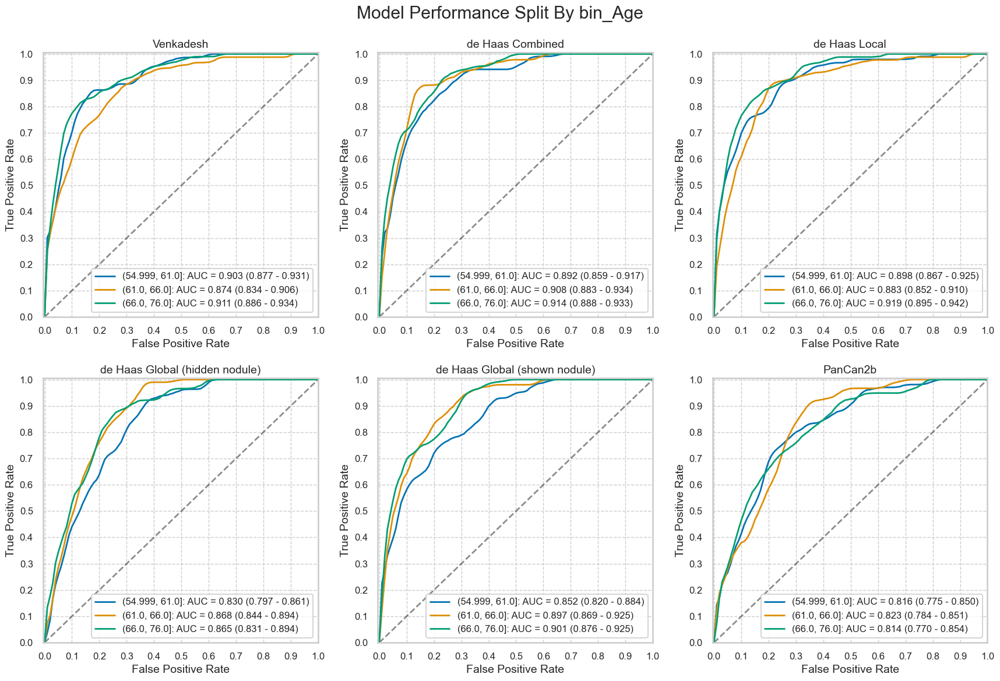

,num,pct,num_mal,pct_mal
"(54.999, 61.0]",1294,39.938272,90,6.955178
"(61.0, 66.0]",1024,31.604938,100,9.765625
"(66.0, 76.0]",922,28.456790,91,9.869848


Not binary: not computing significance test results.


In [25]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=3)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\4236575594.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\4236575594.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    1713.0  0.077058  0.266761  0.0  0.0  0.0  0.0  1.0  1713.0   
(68, 88]    1526.0  0.096986  0.296035  0.0  0.0  0.0  0.0  1.0  1526.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.990660  2.222949  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.219528  1.783248  69.0  70.0  71.0  72.0  78.0

#### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


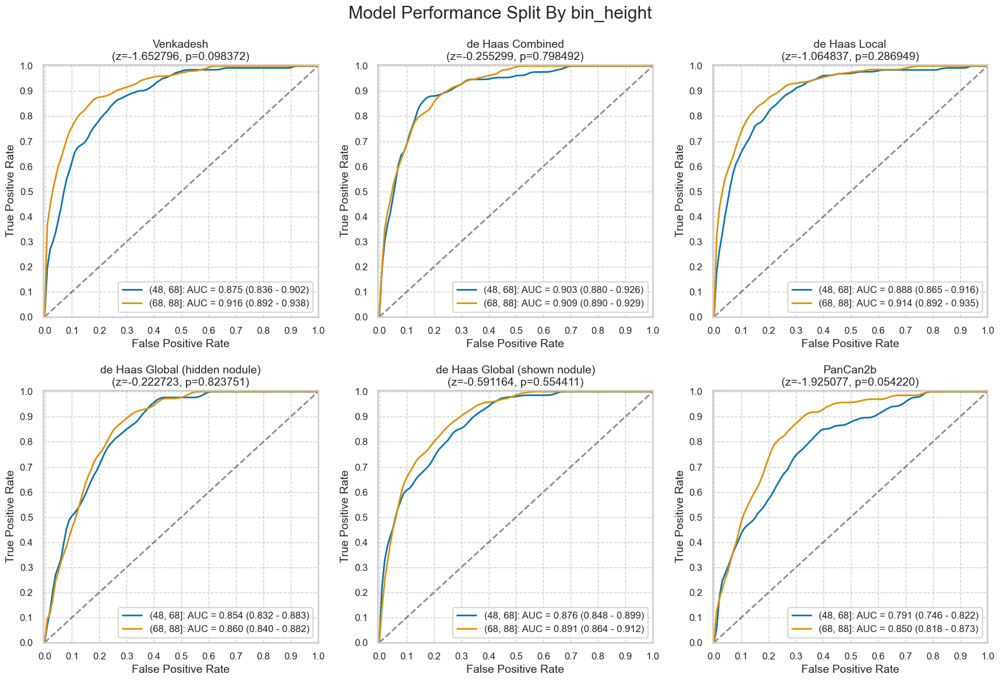

,num,pct,num_mal,pct_mal
"(48, 68]",1713,52.886693,132,7.705779
"(68, 88]",1526,47.113307,148,9.698558


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.652796,-0.255299,-1.064837,-0.222723,-0.591164,-1.925077
p,0.098372,0.798492,0.286949,0.823751,0.554411,0.054220


In [26]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\214614611.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\214614611.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   1642.0  0.093179  0.290772  0.0  0.0  0.0  0.0  1.0  1642.0   
(179, 279]  1541.0  0.081765  0.274095  0.0  0.0  0.0  0.0  1.0  1541.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   151.954324  18.896936   90.0  140.0  155.0  167.0  179.0  
(179, 279]  210.236859  23.974669  180.0  190.0  205.0  225.0  275.0

#### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


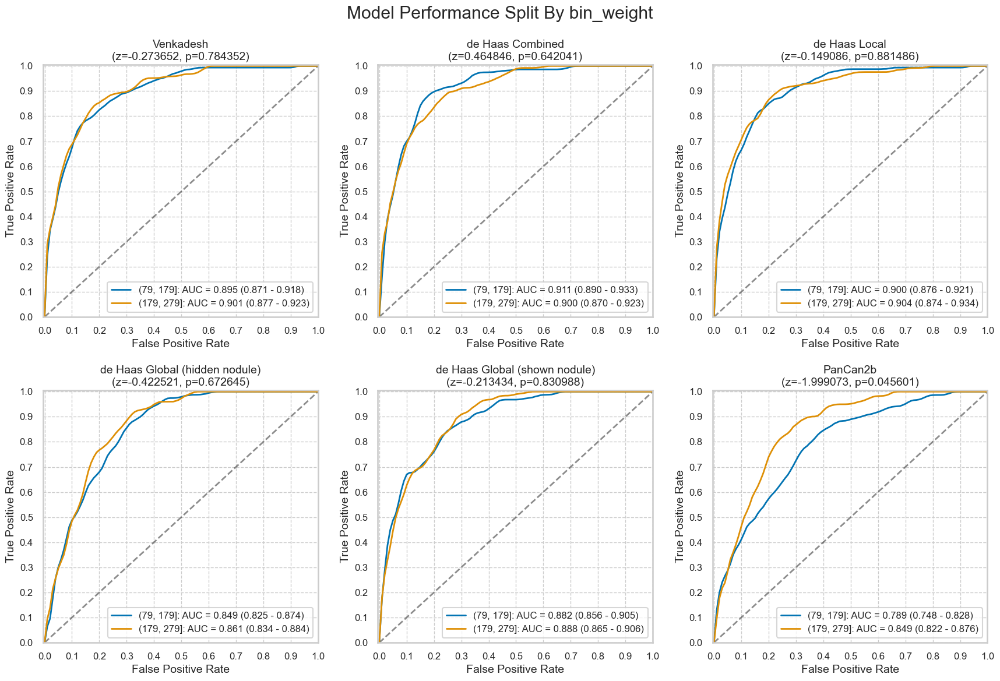

,num,pct,num_mal,pct_mal
"(79, 179]",1642,51.586554,153,9.317905
"(179, 279]",1541,48.413446,126,8.176509


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.273652,0.464846,-0.149086,-0.422521,-0.213434,-1.999073
p,0.784352,0.642041,0.881486,0.672645,0.830988,0.045601


In [27]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,56.730618,22.852350,30.0,40.0,50.0,66.0,177.0
1,281.0,67.787189,25.508996,30.0,49.0,62.0,84.0,224.0


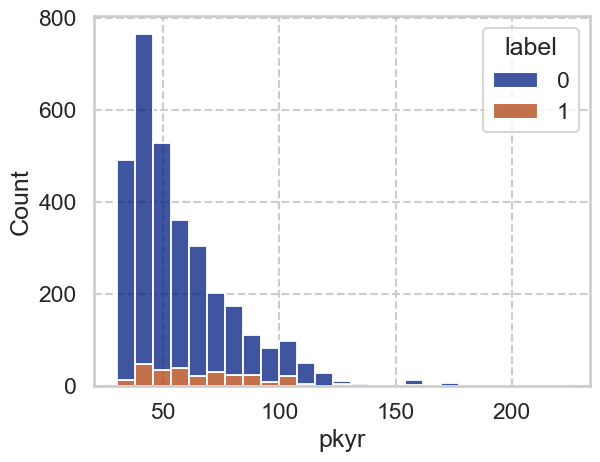

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,16.608314,3.417384,5.0,14.0,16.0,18.0,40.0
1,281.0,16.352313,3.291830,8.0,14.0,16.0,18.0,27.0


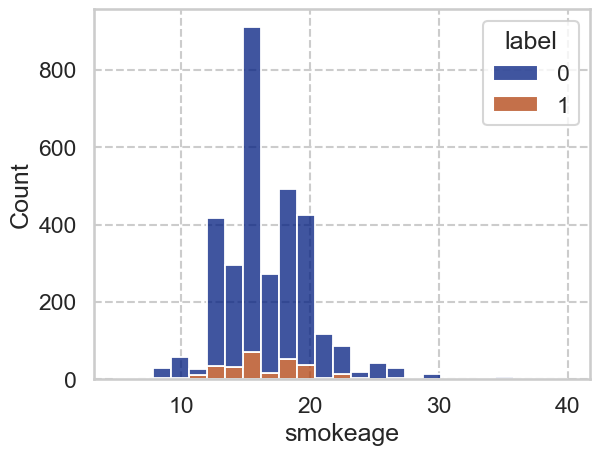

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,28.384927,11.879929,12.0,20.0,25.0,30.0,100.0
1,281.0,30.886121,11.025677,15.0,20.0,30.0,40.0,80.0


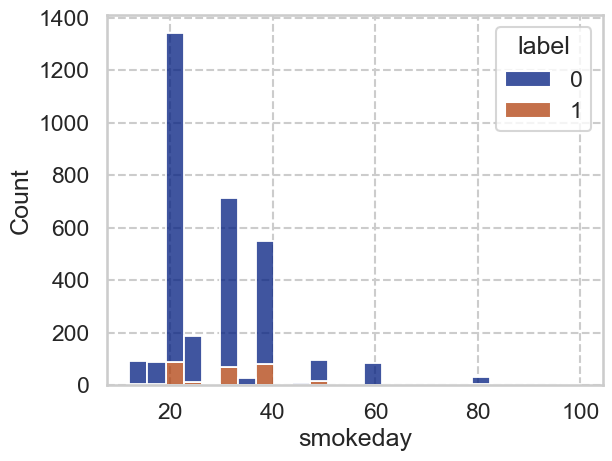

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,40.785738,7.476313,17.0,36.0,41.0,46.0,61.0
1,281.0,44.302491,7.098614,26.0,40.0,44.0,49.0,65.0


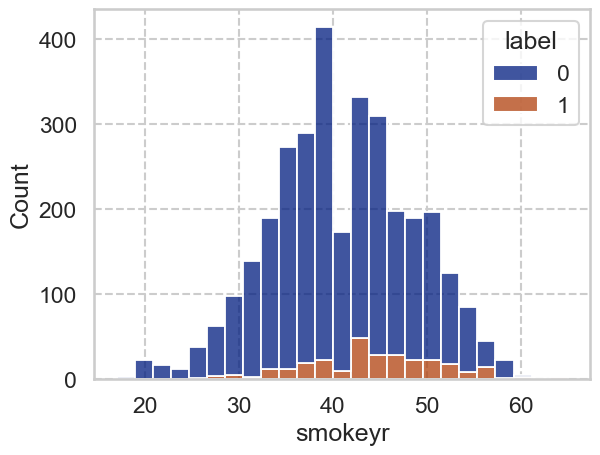

In [28]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  1664.0  0.051683  0.221452  0.0  0.0  0.0  0.0  1.0  1664.0   
(51.0, 224.0]   1576.0  0.123731  0.329379  0.0  0.0  0.0  0.0  1.0  1576.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.966076   5.758863  30.00  37.0  41.0  45.0   51.0  
(51.0, 224.0]   75.346796  21.769836  51.25  58.5  69.0  86.0  224.0

#### bin_pkyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


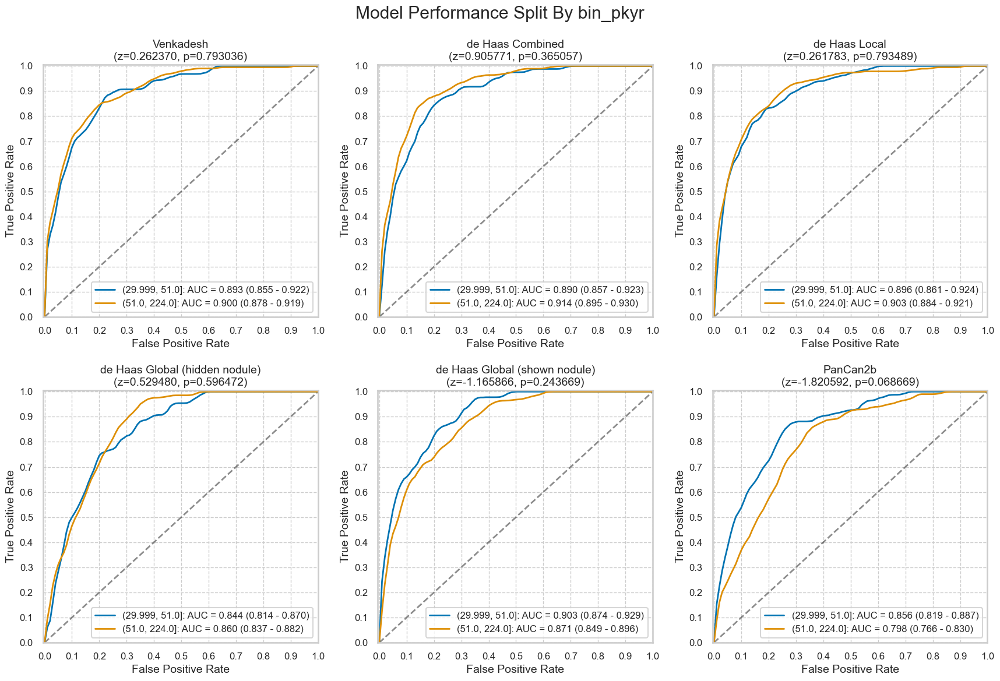

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1664,51.358025,86,5.168269
"(51.0, 224.0]",1576,48.641975,195,12.373096


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.262370,0.905771,0.261783,0.529480,-1.165866,-1.820592
p,0.793036,0.365057,0.793489,0.596472,0.243669,0.068669


C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  1737.0  0.088083  0.283497  0.0  0.0  0.0  0.0  1.0   1737.0   
(16.0, 40.0]   1503.0  0.085163  0.279217  0.0  0.0  0.0  0.0  1.0   1503.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.174439  1.760444   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.373253  2.636122  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


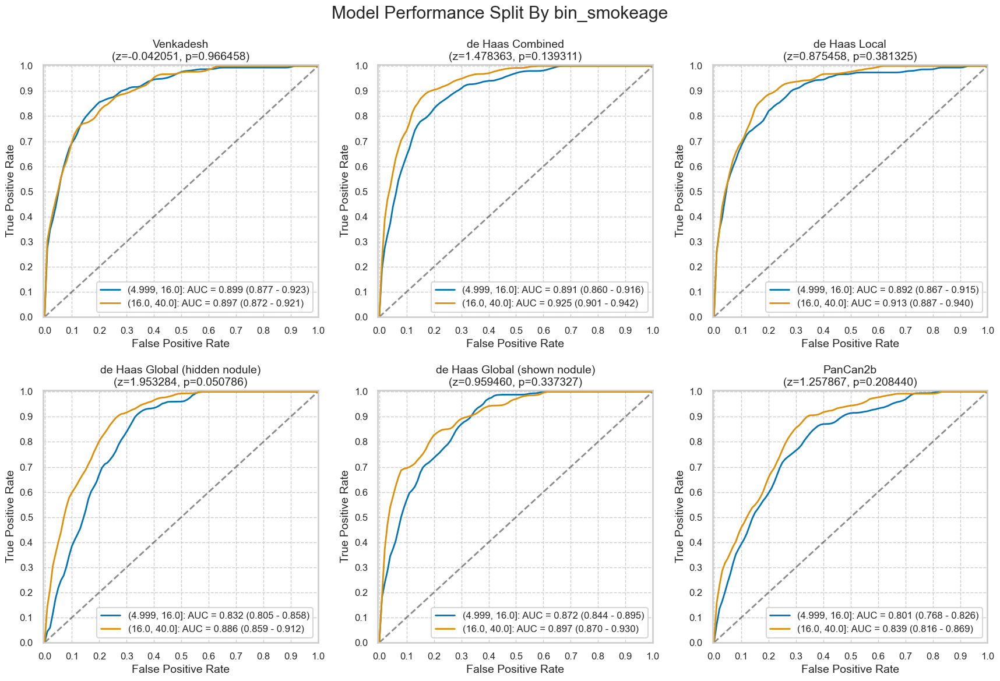

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1737,53.611111,153,8.808290
"(16.0, 40.0]",1503,46.388889,128,8.516301


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.042051,1.478363,0.875458,1.953284,0.959460,1.257867
p,0.966458,0.139311,0.381325,0.050786,0.337327,0.208440


C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  1712.0  0.064252  0.245274  0.0  0.0  0.0  0.0  1.0   1712.0   
(25.0, 100.0]   1528.0  0.111911  0.315360  0.0  0.0  0.0  0.0  1.0   1528.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.131425   2.134221  12.0  20.0  20.0  20.0   25.0  
(25.0, 100.0]   38.092277  11.002887  28.0  30.0  40.0  40.0  100.0

#### bin_smokeday

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


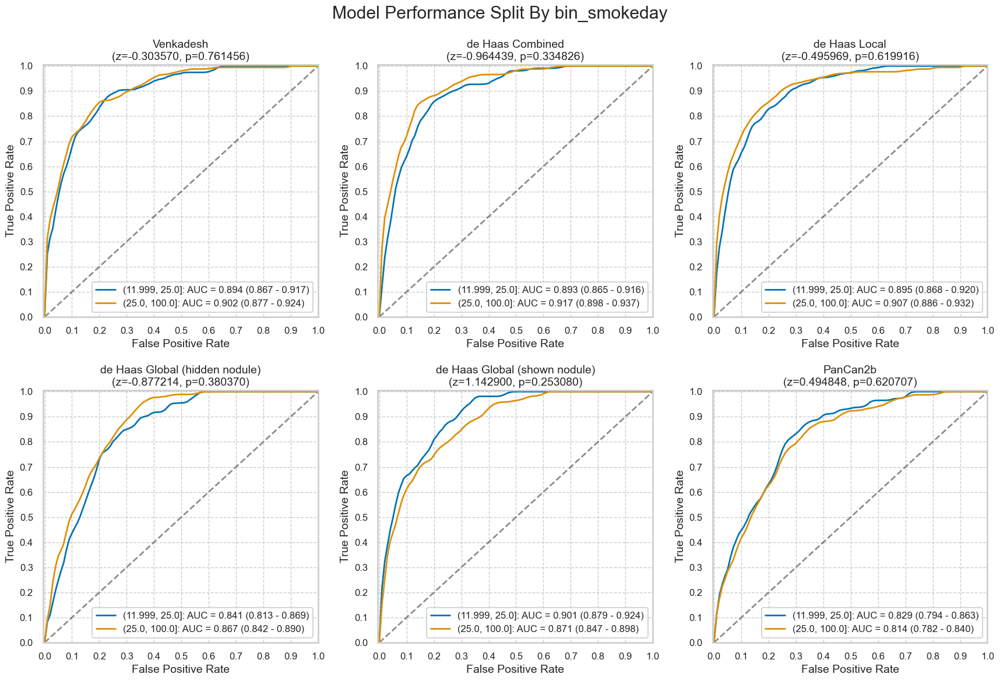

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1712,52.839506,110,6.425234
"(25.0, 100.0]",1528,47.160494,171,11.191099


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-0.303570,-0.964439,-0.495969,-0.877214,1.14290,0.494848
p,0.761456,0.334826,0.619916,0.380370,0.25308,0.620707


C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(16.999, 41.0]  1730.0  0.050867  0.219790  0.0  0.0  0.0  0.0  1.0  1730.0   
(41.0, 65.0]    1510.0  0.127815  0.333994  0.0  0.0  0.0  0.0  1.0  1510.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.542775  4.781479  17.0  33.0  37.0  40.0  41.0  
(41.0, 65.0]    47.447020  4.371368  42.0  44.0  47.0  50.0  65.0

#### bin_smokeyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


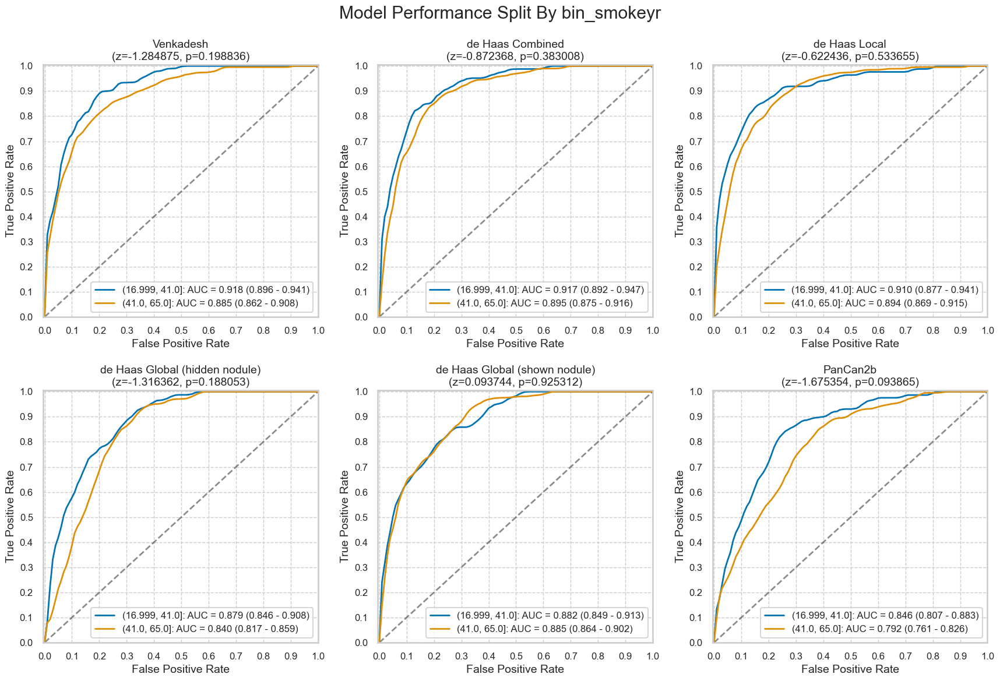

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",1730,53.395062,88,5.086705
"(41.0, 65.0]",1510,46.604938,193,12.781457


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.284875,-0.872368,-0.622436,-1.316362,0.093744,-1.675354
p,0.198836,0.383008,0.533655,0.188053,0.925312,0.093865


In [29]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,7.470260,4.248909,4.0,4.9,6.1,8.4,44.4
1,281.0,14.009964,9.736201,4.1,8.2,11.5,16.9,83.0


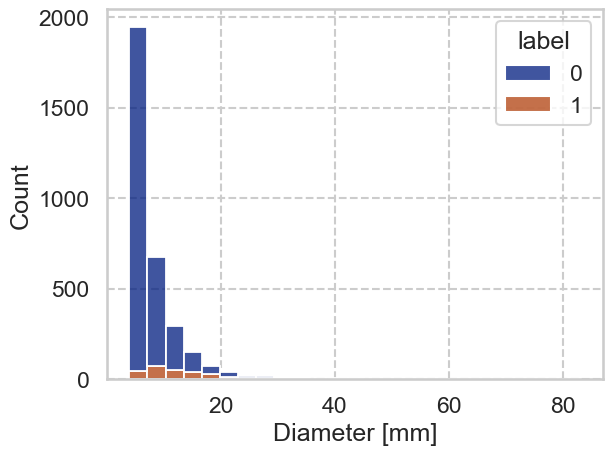

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,2959.0,2.566746,1.708722,1.0,1.0,2.0,4.0,11.0
1,281.0,2.391459,1.474715,1.0,1.0,2.0,3.0,10.0


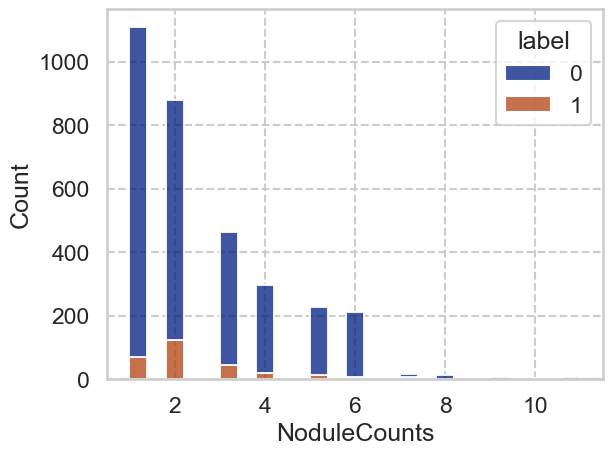

In [30]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3226706664.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3226706664.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
(0, 1]            1110.0  0.063964  0.244799  0.0  0.0  0.0  0.0  1.0   
(1, 12]           2130.0  0.098592  0.298183  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                 1110.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]                2130.0  3.360094  1.561155  2.0  2.0  3.0  4.0  11.0

#### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


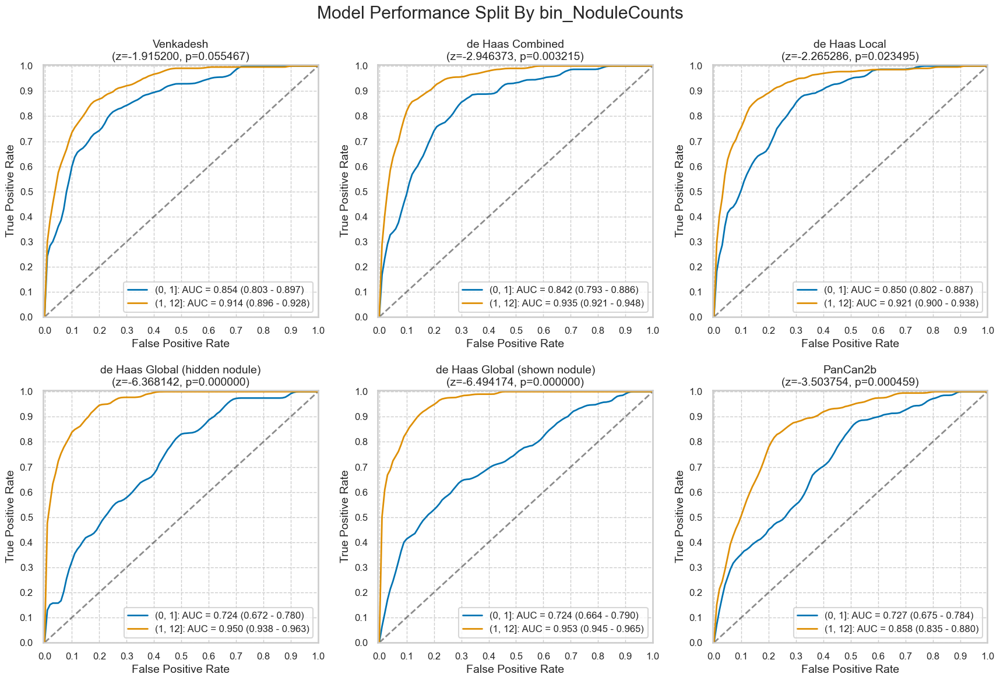

,num,pct,num_mal,pct_mal
"(0, 1]",1110,34.259259,71,6.396396
"(1, 12]",2130,65.740741,210,9.859155


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.915200,-2.946373,-2.265286,-6.368142e+00,-6.494174e+00,-3.503754
p,0.055467,0.003215,0.023495,1.913312e-10,8.349045e-11,0.000459


In [31]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3128368612.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2)
C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3128368612.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())


label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
(3.999, 6.3]       1657.0  0.020519  0.141810  0.0  0.0  0.0  0.0  1.0   
(6.3, 83.0]        1583.0  0.156033  0.363001  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
(3.999, 6.3]             1657.0   5.058540  0.665707  4.0  4.5  5.0   5.6   
(6.3, 83.0]              1583.0  11.155591  6.163079  6.4  7.5  9.1  12.7   

                         
                    max  
bin_Diameter [mm]        
(3.999, 6.3]        6.3  
(6.3, 83.0]        83.0

#### bin_Diameter [mm]

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


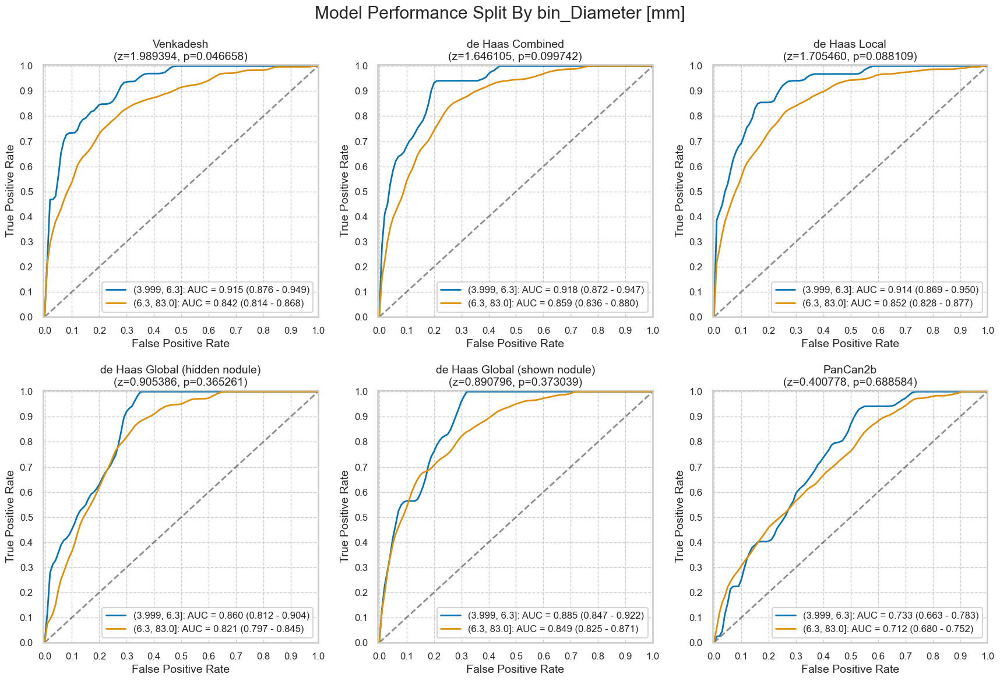

,num,pct,num_mal,pct_mal
"(3.999, 6.3]",1657,51.141975,34,2.051901
"(6.3, 83.0]",1583,48.858025,247,15.603285


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,1.989394,1.646105,1.705460,0.905386,0.890796,0.400778
p,0.046658,0.099742,0.088109,0.365261,0.373039,0.688584


In [32]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')

## Further binning categorical columns

In [33]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       2994
2.0   2.0        107
6.0   2.0         35
3.0   2.0         35
1.0   1.0         23
4.0   2.0         20
5.0   2.0          9
2.0   1.0          1
Name: count, dtype: int64

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\3379857195.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['NonHispanicWhite'] = non_hispanic_white


#### NonHispanicWhite

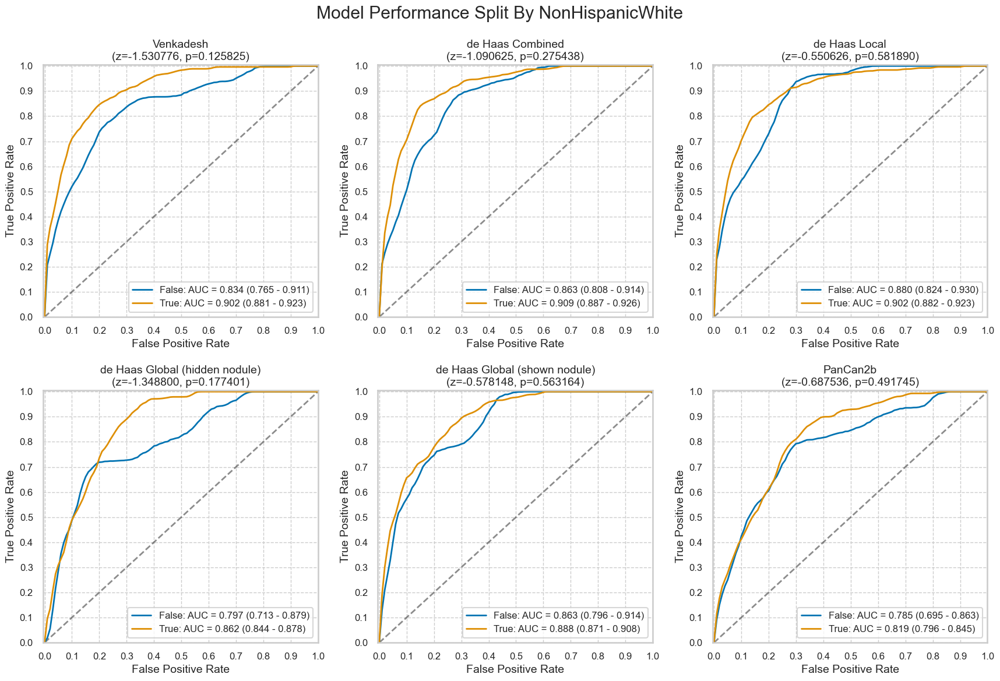

,num,pct,num_mal,pct_mal
False,246,7.592593,33,13.414634
True,2994,92.407407,248,8.283233


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,-1.530776,-1.090625,-0.550626,-1.348800,-0.578148,-0.687536
p,0.125825,0.275438,0.581890,0.177401,0.563164,0.491745


In [34]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

In [35]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\1645139400.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['HighSchoolPlus'] = high_school_plus


#### HighSchoolPlus

Less than two groups. SKIP


,num,pct,num_mal,pct_mal
False,75,2.314815,7,9.333333
True,3165,97.685185,274,8.657188


Not binary: not computing significance test results.


C:\Users\shaur\AppData\Local\Temp\ipykernel_18068\502951494.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nlst_preds['Married'] = married


#### Married

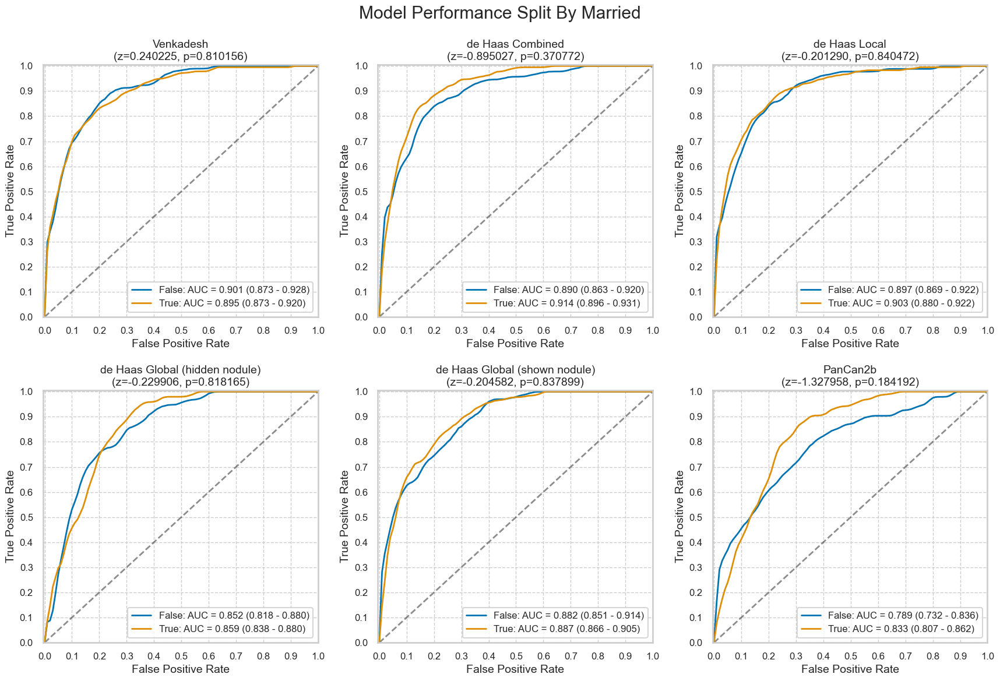

,num,pct,num_mal,pct_mal
False,1058,32.654321,93,8.790170
True,2182,67.345679,188,8.615949


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),de Haas Global (shown nodule),PanCan2b
z,0.240225,-0.895027,-0.201290,-0.229906,-0.204582,-1.327958
p,0.810156,0.370772,0.840472,0.818165,0.837899,0.184192


In [36]:
married = (nlst_preds['marital'] == 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')